<a href="https://colab.research.google.com/github/Armaan-Raina/Estrous-Phase-Classification/blob/main/Estrous_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Estrous Cycle Phase Classification**

## **Preprocessing/ Feature Extraction**

### **Importing Packages**

In [1]:
!pip install pyABF efel

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 82.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 712.5/712.5 kB 40.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.0/104.0 kB 8.9 MB/s eta 0:00:00


In [2]:
import pyabf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob
from scipy import signal
import scipy
import seaborn as sns
import efel
from sklearn.manifold import TSNE

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import classification_report
import numpy as np # Ensure numpy is imported
from sklearn.model_selection import train_test_split # Ensure train_test_split is imported
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

import pandas as pd
import numpy as np
import statsmodels.formula.api as smf
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

import matplotlib.colors as mcolors
import pickle

from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [ ]:
!pip freeze > requirements.txt

### **Uploading raw data**

In [104]:
raw_mEPSC_diestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Diestrus/*.abf')
raw_mEPSC_estrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Estrus/*.abf')
raw_mEPSC_Eproestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Early Proestrus/*.abf')
raw_mEPSC_Lproestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Late Proestrus/*.abf')

In [105]:

raw_spike_diestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Diestrus Spiking/*.abf')
raw_spike_estrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Estrus Spiking/*.abf')
raw_spike_Eproestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Early Proestrus Spiking/*.abf')
raw_spike_Lproestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Late Proestrus Spiking/*.abf')

In [106]:
raw_passive_diestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Diestrus Passive/*.abf')
raw_passive_estrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Estrus Passive/*.abf')
raw_passive_Eproestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Early Proestrus Passive/*.abf')
raw_passive_Lproestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Late Proestrus Passive/*.abf')

In [107]:
len(raw_mEPSC_diestrus), len(raw_mEPSC_estrus), len(raw_mEPSC_Eproestrus), len(raw_mEPSC_Lproestrus)

(28, 16, 19, 44)

In [108]:
len(raw_passive_diestrus), len(raw_passive_estrus), len(raw_passive_Eproestrus), len(raw_passive_Lproestrus)

(117, 65, 76, 125)

In [109]:
len(raw_spike_diestrus), len(raw_spike_estrus), len(raw_spike_Eproestrus), len(raw_spike_Lproestrus)

(135, 52, 65, 146)

### **Defining functions for preprocessing**


In [110]:
def read_abf(filename:str) -> np.ndarray:

    abf = pyabf.ABF(filename)
    time = np.array([], dtype=float)
    current = np.array([], dtype=float)
    sweep_len = abf.sweepX[-1]

    for sweep in range(abf.sweepCount):
        abf.setSweep(sweep)
        current = np.concatenate((current, abf.sweepY))
        time = np.concatenate((time, abf.sweepX + sweep * sweep_len)) #keeps getting reset for each trace I think, how to concatentate time instead?
    return current

### **Preprocessing for Spiking Data**

In [ ]:
abf = pyabf.ABF(raw_spike_diestrus[0])
for sweep in abf.sweepList:
  abf.setSweep(sweep)
  plt.plot(abf.sweepX, abf.sweepY)

In [ ]:
#abf -> list of np.ndarrays
clean_diestrus = []
clean_estrus = []
clean_Eproestrus = []
clean_Lproestrus = []

for file in raw_spike_diestrus:
  clean_diestrus.append(read_abf(file))

for file in raw_spike_estrus:
  clean_estrus.append(read_abf(file))

for file in raw_spike_Eproestrus:
  clean_Eproestrus.append(read_abf(file))

for file in raw_spike_Lproestrus:
  clean_Lproestrus.append(read_abf(file))

#### **Following code snippets modified based on implemented from [link text](https://)https://spikesandbursts.wordpress.com/2023/08/24/patch-clamp-data-analysis-in-python-bursts/**

In [ ]:
def spike_detection(sig, fs):
  thresh_min = -25
  thresh_prominence = 15
  thresh_min_width = 0.5 * (fs/1000)
  distance_min = 1 * (fs/1000)

  peaks, peaks_dict = scipy.signal.find_peaks(sig,
            height=thresh_min,
            threshold=thresh_min,
            distance=distance_min,
            prominence=thresh_prominence,
            width=thresh_min_width,
            wlen=None,       # Window length to calculate prominence
            rel_height=0.5,  # Relative height at which the peak width is measured
            plateau_size=None)
  spikes_table = pd.DataFrame(columns = ['spike', 'spike_index', 'spike_time',
                                        'inst_freq', 'isi_s',
                                        'width', 'rise_half_ms', 'decay_half_ms',
                                        'spike_peak', 'spike_amplitude'])

  spikes_table.spike = np.arange(1, len(peaks) + 1)
  spikes_table.spike_index = peaks
  spikes_table.spike_time = peaks / fs  # Divided by fs to get s
  spikes_table.isi_s = np.diff(peaks, axis=0, prepend=peaks[0]) / fs
  spikes_table.inst_freq = 1 / spikes_table.isi_s
  spikes_table.width = peaks_dict['widths']/(fs/1000) # Width (ms) at half-height
  spikes_table.rise_half_ms = (peaks - peaks_dict['left_ips'])/(fs/1000)
  spikes_table.decay_half_ms = (peaks_dict['right_ips'] - peaks)/(fs/1000)
  spikes_table.spike_peak = peaks_dict['peak_heights']  # height parameter is needed
  spikes_table.spike_amplitude = peaks_dict['prominences']  # prominence parameter is needed

  return spikes_table

In [ ]:
abf = pyabf.ABF(raw_spike_diestrus[0])
print(abf.dataPointsPerMs*1000)

In [ ]:
##Testing on one file
df = spike_detection(clean_diestrus[0][1], 20000)

In [ ]:
mod_df = df.drop(["spike",	"spike_index",	"spike_time"], axis=1)

In [ ]:
mod_df = mod_df.replace([-np.inf, np.inf], np.nan).dropna()

In [ ]:
plt.matshow(mod_df.corr())
cb = plt.colorbar()

cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

In [ ]:
#Estimating parameters based on diestrus trace
hist_data = mod_df['isi_s']

hist_stats = pd.DataFrame()

bin_size = 10 #ms

isi_range = np.ptp(hist_data)
bins = int((isi_range * 1000 / bin_size) + 0.5)  # Round to the nearest integer
hist = np.histogram(hist_data, bins=bins)
hist_counts = hist[0]
hist_bins = hist[1]

# Cumulative moving average
cum = np.cumsum(hist_counts)  # Cumulative sum
cma = cum / np.arange(1, len(cum) + 1)

# Calculate peaks and valleys of the cma
cma_peaks_indexes = scipy.signal.argrelextrema(cma, np.greater)
cma_valleys_indexes = scipy.signal.argrelextrema(cma, np.less)

# Select the peak you're interested in
peak_index = cma_peaks_indexes[0][0]  # Change second number to select the peak
alpha = cma[peak_index] * 0.5  # Half-peak, adapt the value to your threshold criterion

# Calculate cma_threshold_index relative to the selected cma_peak
cma_threshold = (np.argmin(cma[peak_index:] >= alpha) + peak_index) * bin_size/1000

# Dataframe with histogram statistics
length = len(hist_stats)
hist_stats.loc[length, 'mean_isi'] = np.mean(hist_data)
hist_stats.loc[length, 'median_isi'] = np.median(hist_data)
hist_stats.loc[length, 'kurtosis'] = scipy.stats.kurtosis(hist_counts)
hist_stats.loc[length, 'skewness'] = scipy.stats.skew(hist_counts, bias=True)
hist_stats.loc[length, 'cma_threshold'] = cma_threshold
hist_stats.loc[length, 'cma_valley_time'] = cma_valleys_indexes[0][1] * bin_size/1000  # Change peak index as needed
hist_stats.loc[length, 'cma_peak_time'] = cma_peaks_indexes[0][0] * bin_size/1000  # Change peak index as needed

# Plot ISI histogram
fig, ax = plt.subplots(figsize=(8, 4))
ax.set_title("ISI histogram")
ax.hist(hist_data, bins=bins, alpha=0.6)

# Plot CMA
cma_x = np.linspace(np.min(hist_bins), np.max(hist_bins), bins)
ax.plot(cma_x, cma)

# Plot CMA threshold line
ax.axvline(cma_threshold, linestyle="dotted", color="gray")

# Plot CMA valleys
ax.plot(cma_x[cma_valleys_indexes], cma[cma_valleys_indexes], 'ko')
ax.plot(cma_x[cma_peaks_indexes], cma[cma_peaks_indexes], 'mo')

# ax.set_xscale('log')  # Logarithmic scale may be easier to set the threshold
ax.set_xlabel("Time bins (s)")
ax.set_ylabel("Count")
ax.set_xlim([0,1])

# Show graph and table
plt.show()
hist_stats

In [ ]:
def burst_detection(df, spike_times, spike_amplitudes, spike_peaks, n_spikes, max_isi, min_ibi=None):
    df = df.sort_values(by=spike_times)
    df['burst'] = np.nan
    burst_num = 0
    burst_start = None
    last_spike = None
    for i, row in df.iterrows():  # Loop through DataFrame rows
      spike = row[spike_times]   # Extract the spike position

      if burst_start is None:   # It checks if it is the first spike
          burst_start = spike   # It marks the current spike position as the start of a burst
          last_spike = spike    # Update the last_spike position to the current spike position
          df.at[i, 'burst'] = burst_num   # Assign burst number
      elif spike - last_spike <= max_isi:  # It checks if the current spike is within max isi
          df.at[i, 'burst'] = burst_num
          last_spike = spike
      elif spike - last_spike > min_ibi:  # It checks if the interburst interval has been reached
          burst_num += 1
          burst_start = spike
          last_spike = spike
          df.at[i, 'burst'] = burst_num

      # Filter bursts with less than min_spikes
    df = df[df.groupby('burst')[spike_times].transform('count') >= n_spikes]

    # Filter burst shorter that min_duration (min_duration parameter)
    # df = df[df.groupby('burst')[spike_times].transform('max')
    #         - df.groupby('burst')[spike_times].transform('min')
    #         >= min_duration]

    # Calculate burst information by aggregating single spike information
    bursts = df.groupby('burst')[spike_times].agg(['min', 'max', 'count'])
    bursts.columns = ['burst_start', 'burst_end', 'spikes_in_bursts']
    bursts['burst_length'] = bursts['burst_end'] - bursts['burst_start']
    bursts['avg_spike_amplitude'] = df.groupby('burst')[spike_amplitudes].mean()
    bursts['avg_spike_peaks'] = df.groupby('burst')[spike_peaks].mean()
    bursts['spikes_frequency'] = bursts['spikes_in_bursts'] / bursts['burst_length']
    bursts = bursts.reset_index()
    bursts['burst_number'] = bursts.index + 1


    return bursts[['burst_number', 'burst_start', 'burst_end',
                  'burst_length', 'spikes_in_bursts', 'avg_spike_amplitude',
                  'avg_spike_peaks', 'spikes_frequency']]


In [ ]:
diestrus_spiking = pd.DataFrame()
estrus_spiking = pd.DataFrame()
Eproestrus_spiking = pd.DataFrame()
Lproestrus_spiking = pd.DataFrame()


for trace in clean_diestrus:
  spikes_table = spike_detection(trace[1], 20000)
  diestrus_spiking = pd.concat([diestrus_spiking, burst_detection(spikes_table, 'spike_time', 'spike_amplitude', 'spike_peak', n_spikes = 2, max_isi=0.5, min_ibi=0.1)])

for trace in clean_estrus:
  spikes_table = spike_detection(trace[1], 20000)
  estrus_spiking = pd.concat([estrus_spiking, burst_detection(spikes_table, 'spike_time', 'spike_amplitude', 'spike_peak', n_spikes = 2, max_isi=0.5, min_ibi=0.1)])

for trace in clean_Eproestrus:
  spikes_table = spike_detection(trace[1], 20000)
  Eproestrus_spiking = pd.concat([Eproestrus_spiking, burst_detection(spikes_table, 'spike_time', 'spike_amplitude', 'spike_peak', n_spikes = 2, max_isi=0.5, min_ibi=0.1)])

for trace in clean_Lproestrus:
  spikes_table = spike_detection(trace[1], 20000)
  Lproestrus_spiking = pd.concat([Lproestrus_spiking, burst_detection(spikes_table, 'spike_time', 'spike_amplitude', 'spike_peak', n_spikes = 2, max_isi=0.5, min_ibi=0.1)])

In [ ]:
diestrus_spiking.to_csv("/content/drive/MyDrive/Estrous Classification Project/diestrus_spiking_feats")
estrus_spiking.to_csv("/content/drive/MyDrive/Estrous Classification Project/estrus_spiking_feats")
Eproestrus_spiking.to_csv("/content/drive/MyDrive/Estrous Classification Project/Earlyproestrus_spiking_feats")
Lproestrus_spiking.to_csv("/content/drive/MyDrive/Estrous Classification Project/Lateproestrus_spiking_feats")

### **Preprocessing for Passive Data**

In [ ]:
#Exploration of abf file to determine constants
abf = pyabf.ABF(raw_passive_Lproestrus[0])
sweeps = abf.sweepList

for sweep in sweeps:
  abf.setSweep(sweep)
  plt.plot(abf.sweepX, abf.sweepC)

abf.setSweep(4)

##Finding the start and end indices of the stimulation
stim_start = 0
stim_end = 0
idx = 0
startFlag = False

val = abf.sweepC

while val[idx] == 0:
  idx+=1
  stim_start += 1

print(stim_start)


for i in range(stim_start, len(val)+1):
  if val[i] == 0:
    stim_end = i
    break

print(stim_end)
print(abf.sweepX[9562])
print(abf.sweepX[stim_end])
plt.plot(abf.sweepX, abf.sweepC)
plt.axvline(0.4781, color='r')
plt.axvline(1.0781, color='g')

print(abf.sweepEpochs)


In [ ]:
##CONSTANTS - determined in last block
stim_start = [4781 / abf.dataRate * 1000]  # ms
stim_end = [10781 / abf.dataRate * 1000]   # ms

ir_current_start = [i for i in range(-140, 10, 10)]
ir_current_stop = 0

curr_start_idx = 4781
curr_stop_idx = 10781

In [ ]:
ir_current_start, abf.dataPointsPerMs * 1000 #20 kHz sampling rate

In [ ]:
abf.sweepList


In [ ]:
def init_features(filename):
    abf = pyabf.ABF(filename)
    sweeps = abf.sweepList

    table = pd.DataFrame(columns=[
        'rmp_mV',
        'steady_state_voltage_mV',
        'vmin_mV',
        'vdeflection_begin_mV',
        'vrebound_mV',
        'voltage_delta_mV',
        'current_pA',
        'input_resistance_Gohm',
        'time_constant_ms',
        'capacitance_pF',
        'sag_amplitude_mV',
        'sag_ratio1',
        'sag_ratio2',
        'sweep',
        'inward_rectification_ratio'
    ])

    inwardRec = []
    inwardRecRatio = np.nan   # ← define safely before loop

    for sweep in sweeps:
        abf.setSweep(sweep)

        stim_start_index = 4781
        stim_end_index = 10781
        stim_start = [abf.sweepX[stim_start_index] * 1000]
        stim_end = [abf.sweepX[stim_end_index] * 1000]

        current_pA = np.mean(abf.sweepC[stim_start_index:stim_end_index])

        trace = {
            'T': abf.sweepX * 1000,
            'V': abf.sweepY,
            'stim_start': stim_start,
            'stim_end': stim_end
        }

        feature_values = efel.get_feature_values(
            [trace],
            [
                'voltage_base', 'steady_state_voltage_stimend',
                'minimum_voltage', 'voltage_deflection_begin',
                'voltage_deflection', 'voltage_deflection_vb_ssse',
                'decay_time_constant_after_stim', 'sag_amplitude',
                'sag_ratio1', 'sag_ratio2', 'voltage_after_stim'
            ]
        )[0]

        def safe_get(key, idx=0):
            return feature_values[key][idx] if (key in feature_values and feature_values[key] is not None) else np.nan

        base_v = safe_get('voltage_base')
        steady_v = safe_get('steady_state_voltage_stimend')
        vmin = safe_get('minimum_voltage')
        vdeflection_begin = safe_get('voltage_deflection_begin')
        vrebound = safe_get('voltage_after_stim')
        sag_amp = safe_get('sag_amplitude')
        sag_ratio1 = safe_get('sag_ratio1')
        sag_ratio2 = safe_get('sag_ratio2')
        tau = safe_get('decay_time_constant_after_stim')

        delta_v = steady_v - base_v if not np.isnan(steady_v) and not np.isnan(base_v) else np.nan
        Rin = delta_v / current_pA if current_pA != 0 else np.nan
        capacitance = tau / Rin if Rin and not np.isnan(tau) and Rin != 0 else np.nan

        # record specific sweeps for inward rectification ratio
        if sweep == 1:
            inwardRec.append(Rin)
        if sweep == 14:
            inwardRec.append(Rin)

        table.loc[len(table)] = [
            base_v, steady_v, vmin, vdeflection_begin, vrebound, delta_v,
            current_pA, Rin, tau, capacitance, sag_amp, sag_ratio1, sag_ratio2, sweep, np.nan
        ]

    # --- compute ratio safely after loop ---
    if len(inwardRec) == 2 and not any(np.isnan(inwardRec)):
        inwardRecRatio = inwardRec[1] / inwardRec[0]

    # --- fill ratio for this file’s rows ---
    table.iloc[-len(sweeps):, table.columns.get_loc('inward_rectification_ratio')] = inwardRecRatio

    return table


In [ ]:
diestrus_passive_df = pd.DataFrame()
estrus_passive_df = pd.DataFrame()
Eproestrus_passive_df = pd.DataFrame()
Lproestrus_passive_df = pd.DataFrame()

for filename in raw_passive_diestrus:
  df = init_features(filename)
  diestrus_passive_df = pd.concat([df, diestrus_passive_df])

diestrus_passive_df['label'] = 0



for filename in raw_passive_estrus:
  df = init_features(filename)
  estrus_passive_df = pd.concat([df, estrus_passive_df])

estrus_passive_df['label'] = 1

for filename in raw_passive_Eproestrus:
  df = init_features(filename)
  Eproestrus_passive_df = pd.concat([df, Eproestrus_passive_df])

Eproestrus_passive_df['label'] = 2


for filename in raw_passive_Lproestrus:
  df = init_features(filename)
  Lproestrus_passive_df = pd.concat([df, Lproestrus_passive_df])

Lproestrus_passive_df['label'] = 3




In [ ]:
diestrus_passive_df.head(n = 45)

In [ ]:
diestrus_passive_df = diestrus_passive_df.dropna()
estrus_passive_df = estrus_passive_df.dropna()
Eproestrus_passive_df = Eproestrus_passive_df.dropna()
Lproestrus_passive_df = Lproestrus_passive_df.dropna()

In [ ]:
diestrus_passive_df.shape, estrus_passive_df.shape, Eproestrus_passive_df.shape, Lproestrus_passive_df.shape

In [ ]:
diestrus_passive_df.to_csv("/content/drive/MyDrive/Estrous Classification Project/diestrus_passive_feats")
estrus_passive_df.to_csv("/content/drive/MyDrive/Estrous Classification Project/estrus_passive_feats")
Eproestrus_passive_df.to_csv("/content/drive/MyDrive/Estrous Classification Project/Eproestrus_passive_feats")
Lproestrus_passive_df.to_csv("/content/drive/MyDrive/Estrous Classification Project/Lproestrus_passive_feats")

## **Feature Loading**



### **mEPSC (MiniAnalysis) Features**

In [3]:
mEPSC_diestrus = pd.read_excel('/content/drive/MyDrive/Spreadsheets/diestrus.xlsx')
mEPSC_estrus = pd.read_excel('/content/drive/MyDrive/Spreadsheets/estrus.xlsx')
mEPSC_Eproestrus = pd.read_excel('/content/drive/MyDrive/Spreadsheets/earlyproestrus.xlsx')
mEPSC_Lproestrus = pd.read_excel('/content/drive/MyDrive/Spreadsheets/lateproestrus.xlsx')

In [4]:
#Filtering out extraneous events likely due to experimental setup or other circumstances
mEPSC_diestrus = mEPSC_diestrus[(mEPSC_diestrus['Amplitude'] < 50) & (mEPSC_diestrus['Baseline'] > 0)]
mEPSC_estrus = mEPSC_estrus[(mEPSC_estrus['Amplitude'] < 50) & (mEPSC_estrus['Baseline'] > 0)]
mEPSC_Eproestrus = mEPSC_Eproestrus[(mEPSC_Eproestrus['Amplitude'] < 50) & (mEPSC_Eproestrus['Baseline'] > 0)]
mEPSC_Lproestrus = mEPSC_Lproestrus[(mEPSC_Lproestrus['Amplitude'] < 50) & (mEPSC_Lproestrus['Baseline'] > 0)]

In [5]:
def compute_iei(df: pd.DataFrame) -> pd.DataFrame:
    df["Inter-Event Interval (ms)"] = df["Time (ms)"].diff()
    return df

In [6]:
#Simple IEI computation
mEPSC_diestrus = compute_iei(mEPSC_diestrus)
mEPSC_estrus = compute_iei(mEPSC_estrus)
mEPSC_Eproestrus = compute_iei(mEPSC_Eproestrus)
mEPSC_Lproestrus = compute_iei(mEPSC_Lproestrus)

In [7]:
mEPSC_Lproestrus.head()

,Obs Num,Time (ms),Amplitude,Rise (ms),Decay (ms),Area,Baseline,Noise,Group,Channel,10-90Rise,HalfWidth,Rise50,Peak Dir,Burst#,BurstE#,10-90Slope,Rel Time,Inter-Event Interval (ms)
0,1,3247.8,11.597,1.0,0.3,6.59,18.311,0.610,0,0,0.81,0.33,0.2,-1,0,0,-11.50,687.8,NaN
1,2,3566.4,11.597,1.8,0.4,10.44,15.869,-1.221,0,0,1.72,0.39,0.2,-1,0,0,-5.39,1006.4,318.6
2,3,3710.0,9.766,3.4,1.7,24.60,17.700,0.610,0,0,1.81,0.26,0.2,-1,0,0,-4.31,1150.0,143.6
3,4,4287.2,8.545,1.2,1.0,7.69,17.090,-2.441,0,0,1.10,0.21,0.1,-1,0,0,-6.20,1727.2,577.2
4,5,4945.4,12.817,5.5,3.0,58.35,15.259,-4.272,0,0,4.16,0.59,0.3,-1,0,0,-2.46,2385.4,658.2


In [8]:
mEPSC_diestrus.iloc[0, 18] = mEPSC_diestrus.iloc[0, 1]
mEPSC_estrus.iloc[0, 18] = mEPSC_estrus.iloc[0, 1]
mEPSC_Eproestrus.iloc[0, 18] = mEPSC_Eproestrus.iloc[0, 1]
mEPSC_Lproestrus.iloc[0, 18] = mEPSC_Lproestrus.iloc[0, 1]

In [9]:
mEPSC_diestrus.shape

(14384, 19)

In [10]:
mEPSC_min_count = len(min([mEPSC_diestrus, mEPSC_estrus, mEPSC_Eproestrus, mEPSC_Lproestrus], key=len))

In [11]:
mEPSC_diestrus['label'] = 0
mEPSC_estrus['label'] = 1
mEPSC_Eproestrus['label'] = 2
mEPSC_Lproestrus['label'] = 3

In [12]:
mEPSC_diestrus = mEPSC_diestrus.dropna()
mEPSC_estrus = mEPSC_estrus.dropna()
mEPSC_Eproestrus = mEPSC_Eproestrus.dropna()
mEPSC_Lproestrus = mEPSC_Lproestrus.dropna()

In [13]:
mEPSC = pd.concat([mEPSC_diestrus, mEPSC_estrus, mEPSC_Eproestrus, mEPSC_Lproestrus])

In [14]:
#Reducing count of each class to match for testing to determine if class imbalance significantly impacts model accuracy
mEPSC_even = pd.concat([mEPSC_diestrus.head(mEPSC_min_count), mEPSC_estrus.head(mEPSC_min_count), mEPSC_Eproestrus.head(mEPSC_min_count), mEPSC_Lproestrus.head(mEPSC_min_count)])

In [15]:
mEPSC_even.shape

(49344, 20)

In [16]:
mEPSC_even = mEPSC_even.drop(["Obs Num", "Time (ms)", "Group", "Channel", "Peak Dir", "Burst#", "BurstE#", "Rel Time"], axis=1)

In [17]:
mEPSC = mEPSC.drop(["Obs Num", "Time (ms)", "Group", "Channel", "Peak Dir", "Burst#", "BurstE#", "Rel Time"], axis=1) #Dropping insignificant features

In [18]:
mEPSC_names = ["Amplitude",	"Rise (ms)",	"Decay (ms)",	"Area",	"Baseline",	"Noise",	"10-90Rise",	"HalfWidth",	"Rise50",	"10-90Slope", "Inter-Event Interval (ms)"]

### **AP Features**

In [19]:
spiking_diestrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/diestrus_spiking_feats")
spiking_estrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/estrus_spiking_feats")
spiking_Eproestrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/Earlyproestrus_spiking_feats")
spiking_Lproestrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/Lateproestrus_spiking_feats")

In [20]:
spiking_min_count = len(min([spiking_diestrus, spiking_estrus, spiking_Eproestrus, spiking_Lproestrus], key=len))

In [21]:
spiking_diestrus.shape, spiking_estrus.shape, spiking_Eproestrus.shape, spiking_Lproestrus.shape

((972, 9), (492, 9), (645, 9), (1964, 9))

In [22]:
spiking_diestrus['label'] = 0
spiking_estrus['label'] = 1
spiking_Eproestrus['label'] = 2
spiking_Lproestrus['label'] = 3

In [23]:
spiking = pd.concat([spiking_diestrus, spiking_estrus, spiking_Eproestrus, spiking_Lproestrus])

In [24]:
spiking = spiking.drop(["Unnamed: 0", "burst_number", "burst_start", "burst_end"], axis=1) #Dropping insignificant features

In [25]:
spiking_even = pd.concat([spiking_diestrus.head(spiking_min_count), spiking_estrus.head(spiking_min_count), spiking_Eproestrus.head(spiking_min_count), spiking_Lproestrus.head(spiking_min_count)])

In [26]:
spiking_even = spiking_even.drop(["Unnamed: 0", "burst_number", "burst_start", "burst_end"], axis=1) #Dropping insignificant features

In [27]:
spiking_names = ["burst_length",	"spikes_in_bursts",	"avg_spike_amplitude",	"avg_spike_peaks",	"spikes_frequency"]

### **Passive Features**


In [28]:
passive_diestrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/diestrus_passive_feats")
passive_estrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/estrus_passive_feats")
passive_Eproestrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/Eproestrus_passive_feats")
passive_Lproestrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/Lproestrus_passive_feats")
#These already have labels

In [29]:
passive_min_count = len(min([passive_diestrus, passive_estrus, passive_Eproestrus, passive_Lproestrus], key=len))

In [30]:
passive_min_count

910

In [31]:
passive = pd.concat([passive_diestrus, passive_estrus, passive_Eproestrus, passive_Lproestrus])

In [32]:
passive.head()
passive = passive.drop(["Unnamed: 0", "sag_ratio1", "sweep"], axis=1)

In [33]:
passive_even = pd.concat([passive_diestrus.head(passive_min_count), passive_estrus.head(passive_min_count), passive_Eproestrus.head(passive_min_count), passive_Lproestrus.head(passive_min_count)])

In [34]:
passive_even = passive_even.drop(["Unnamed: 0", "sag_ratio1", "sweep"], axis=1)

In [35]:
passive_names = ["rmp_mV",	"steady_state_voltage_mV",	"vmin_mV",	"vdeflection_begin_mV",	"vrebound_mV",	"voltage_delta_mV",	"current_pA",	"input_resistance_Gohm",	"time_constant_ms",	"capacitance_pF",	"sag_amplitude_mV", "sag_ratio1",	"sag_ratio2",	"sweep", "inward_rectification_ratio"]

In [36]:
passive_names_pretty = ["RMP (mV)",	"Steady State Voltage (mV)",	"Min. Voltage (mV)",	"Voltage Deflection Onset (mV)",	"Rebound Voltage (mV)",	"Voltage Change (mV)",	"Current (pA)",	"Input Resistance (GOhms)",	"time_constant_ms",	"capacitance_pF",	"sag_amplitude_mV","sag_ratio2", "inward_rectification_ratio"]

## **Model Training**

#### **Feature Preparation**

In [ ]:
X_mEPSC = mEPSC.drop('label', axis=1)
y_mEPSC = mEPSC['label']

In [ ]:
X_spiking = spiking.drop('label', axis=1)
y_spiking = spiking['label']

In [ ]:
X_passive = passive.drop('label', axis=1)
y_passive = passive['label']

In [ ]:
X_even_mEPSC = mEPSC_even.drop('label', axis=1)
y_even_mEPSC = mEPSC_even['label']
X_even_spiking = spiking_even.drop('label', axis=1)
y_even_spiking = spiking_even['label']
X_even_passive = passive_even.drop('label', axis=1)
y_even_passive = passive_even['label']

In [ ]:
sc = StandardScaler()
X_mEPSC = sc.fit_transform(X_mEPSC)
X_spiking = sc.fit_transform(X_spiking)
X_passive = sc.fit_transform(X_passive)
X_even_mEPSC = sc.fit_transform(X_even_mEPSC)
X_even_spiking = sc.fit_transform(X_even_spiking)
X_even_passive = sc.fit_transform(X_even_passive)

In [ ]:
X_even_mEPSC.shape, y_even_mEPSC.shape, X_even_spiking.shape, y_even_spiking.shape, X_even_passive.shape, y_even_passive.shape

((49344, 11), (49344,), (1968, 5), (1968,), (3640, 13), (3640,))

#### **mEPSC First**

In [ ]:
mEPSC_classification_reports = {}
mEPSC_feature_importances = {}

In [ ]:
SEEDS = [42, 7, 13, 21, 99]

mEPSC_seed_accuracies = {model_name: [] for model_name in [
    'RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC'
]}

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

# Store ALL predictions and true labels for ALL seeds' runs
all_preds_mEPSC = {name: [] for name in model_names}
all_y_tests_mEPSC = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_mEPSC, X_test_mEPSC, y_train_mEPSC, y_test_mEPSC = train_test_split(
        X_mEPSC, y_mEPSC, test_size=0.25, shuffle=True, random_state=seed
    )

    mEPSC_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),  # No random_state
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, mEPSC_models):
        model.fit(X_train_mEPSC, y_train_mEPSC)
        pred = model.predict(X_test_mEPSC)
        acc = accuracy_score(y_test_mEPSC, pred)
        mEPSC_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_mEPSC[name].extend(pred)
        all_y_tests_mEPSC[name].extend(y_test_mEPSC)

        # Feature importances for each seed of the RFC
        if name == 'RFC':
            mEPSC_feature_importances[seed] = model.feature_importances_


# Average across seeds (accuracy)
mEPSC_accuracies = [np.mean(mEPSC_seed_accuracies[name]) for name in model_names]
mEPSC_std = [np.std(mEPSC_seed_accuracies[name]) for name in model_names]
for name in model_names:
    if name in all_preds_mEPSC and name in all_y_tests_mEPSC:
        rep = classification_report(all_y_tests_mEPSC[name], all_preds_mEPSC[name], zero_division=0, output_dict=True)
        mEPSC_classification_reports[name] = rep

#### **Spiking Next**

In [ ]:
spiking_classification_reports = {}
spiking_feature_importances = {}

In [ ]:
SEEDS = [42, 7, 13, 21, 99]  # Same seeds as mEPSC for consistency

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

spiking_seed_accuracies = {name: [] for name in model_names}

# Store ALL predictions and true labels for ALL seeds' runs
all_preds_spiking = {name: [] for name in model_names}
all_y_tests_spiking = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_spiking, X_test_spiking, y_train_spiking, y_test_spiking = train_test_split(
        X_spiking, y_spiking, test_size=0.25, shuffle=True, random_state=seed
    )

    spiking_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),  # No random_state
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, spiking_models):
        model.fit(X_train_spiking, y_train_spiking)
        pred = model.predict(X_test_spiking)
        acc = accuracy_score(y_test_spiking, pred)
        spiking_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_spiking[name].extend(pred)
        all_y_tests_spiking[name].extend(y_test_spiking)

        if name == 'RFC':
            spiking_feature_importances[seed] = model.feature_importances_

# Average across seeds
spiking_accuracies = [np.mean(spiking_seed_accuracies[name]) for name in model_names]
spiking_std = [np.std(spiking_seed_accuracies[name]) for name in model_names]

for name in model_names:
    if name in all_preds_spiking and name in all_y_tests_spiking:
        rep = classification_report(all_y_tests_spiking[name], all_preds_spiking[name], zero_division=0, output_dict=True)
        spiking_classification_reports[name] = rep

/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


#### **Passive Last**

In [ ]:
passive_classification_reports = {}
passive_feature_importances = {}

In [ ]:
SEEDS = [42, 7, 13, 21, 99]

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

passive_seed_accuracies = {name: [] for name in model_names}

# Store ALL predictions and true labels for ALL seeds' runs
all_preds_passive = {name: [] for name in model_names}
all_y_tests_passive = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_passive, X_test_passive, y_train_passive, y_test_passive = train_test_split(
        X_passive, y_passive, test_size=0.25, shuffle=True, random_state=seed
    )

    passive_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, passive_models):
        model.fit(X_train_passive, y_train_passive)
        pred = model.predict(X_test_passive)
        acc = accuracy_score(y_test_passive, pred)
        passive_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_passive[name].extend(pred)
        all_y_tests_passive[name].extend(y_test_passive)

        if name == "RFC":
          passive_feature_importances[seed] = model.feature_importances_

# Average across seeds
passive_accuracies = [np.mean(passive_seed_accuracies[name]) for name in model_names]
passive_std = [np.std(passive_seed_accuracies[name]) for name in model_names]

for name in model_names:
    if name in all_preds_passive and name in all_y_tests_passive:
        rep = classification_report(all_y_tests_passive[name], all_preds_passive[name], zero_division=0, output_dict=True)
        passive_classification_reports[name] = rep

#### **Now again, addressing data inequality**

In [ ]:
###mEPSC###
SEEDS = [42, 7, 13, 21, 99]

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

mEPSC_even_seed_accuracies = {name: [] for name in model_names}

# Store ALL predictions and true labels for ALL seeds' runs
all_preds_mEPSC_even = {name: [] for name in model_names}
all_y_tests_mEPSC_even = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_mEPSC_even, X_test_mEPSC_even, y_train_mEPSC_even, y_test_mEPSC_even = train_test_split(
        X_even_mEPSC, y_even_mEPSC, test_size=0.25, shuffle=True, random_state=seed
    )

    mEPSC_even_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, mEPSC_even_models):
        model.fit(X_train_mEPSC_even, y_train_mEPSC_even)
        pred = model.predict(X_test_mEPSC_even)
        acc = accuracy_score(y_test_mEPSC_even, pred)
        mEPSC_even_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_mEPSC_even[name].extend(pred)
        all_y_tests_mEPSC_even[name].extend(y_test_mEPSC_even)

# Average across seeds
mEPSC_even_accuracies = [np.mean(mEPSC_even_seed_accuracies[name]) for name in model_names]
mEPSC_even_std = [np.std(mEPSC_even_seed_accuracies[name]) for name in model_names]

In [ ]:
###Spiking###
SEEDS = [42, 7, 13, 21, 99]

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

spiking_even_seed_accuracies = {name: [] for name in model_names}

# Store ALL predictions and true labels for ALL seeds' runs
all_preds_spiking_even = {name: [] for name in model_names}
all_y_tests_spiking_even = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_spiking_even, X_test_spiking_even, y_train_spiking_even, y_test_spiking_even = train_test_split(
        X_even_spiking, y_even_spiking, test_size=0.25, shuffle=True, random_state=seed
    )

    spiking_even_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, spiking_even_models):
        model.fit(X_train_spiking_even, y_train_spiking_even)
        pred = model.predict(X_test_spiking_even)
        acc = accuracy_score(y_test_spiking_even, pred)
        spiking_even_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_spiking_even[name].extend(pred)
        all_y_tests_spiking_even[name].extend(y_test_spiking_even)

# Average across seeds
spiking_even_accuracies = [np.mean(spiking_even_seed_accuracies[name]) for name in model_names]
spiking_even_std = [np.std(spiking_even_seed_accuracies[name]) for name in model_names]

/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
###Passive###
SEEDS = [42, 7, 13, 21, 99]

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

passive_even_seed_accuracies = {name: [] for name in model_names}

# Store ALL predictions and true labels for ALL seeds' runs
all_preds_passive_even = {name: [] for name in model_names}
all_y_tests_passive_even = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_passive_even, X_test_passive_even, y_train_passive_even, y_test_passive_even = train_test_split(
        X_even_passive, y_even_passive, test_size=0.25, shuffle=True, random_state=seed
    )

    passive_even_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, passive_even_models):
        model.fit(X_train_passive_even, y_train_passive_even)
        pred = model.predict(X_test_passive_even)
        acc = accuracy_score(y_test_passive_even, pred)
        passive_even_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_passive_even[name].extend(pred)
        all_y_tests_passive_even[name].extend(y_test_passive_even)

# Average across seeds
passive_even_accuracies = [np.mean(passive_even_seed_accuracies[name]) for name in model_names]
passive_even_std = [np.std(passive_even_seed_accuracies[name]) for name in model_names]

#### **Once more with randomized labels**

In [ ]:
rng = np.random.default_rng(seed=42)

In [ ]:
SEEDS = [42, 7, 13, 21, 99]

mEPSC_rnd_seed_accuracies = {model_name: [] for model_name in [
    'RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC'
]}

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

# Store ALL predictions and true labels for ALL seeds' runs
all_preds_mEPSC_rnd = {name: [] for name in model_names}
all_y_tests_mEPSC_rnd = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_mEPSC, X_test_mEPSC, y_train_mEPSC, y_test_mEPSC = train_test_split(
        X_mEPSC, y_mEPSC, test_size=0.25, shuffle=True, random_state=seed
    )
    y_train_mEPSC_rnd = rng.permutation(y_train_mEPSC)

    mEPSC_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),  # No random_state
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, mEPSC_models):
        model.fit(X_train_mEPSC, y_train_mEPSC_rnd)
        pred = model.predict(X_test_mEPSC)
        acc = accuracy_score(y_test_mEPSC, pred)
        mEPSC_rnd_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_mEPSC_rnd[name].extend(pred)
        all_y_tests_mEPSC_rnd[name].extend(y_test_mEPSC)

# Average across seeds (accuracy)
mEPSC_rnd_accuracies = [np.mean(mEPSC_rnd_seed_accuracies[name]) for name in model_names]
mEPSC_rnd_std = [np.std(mEPSC_rnd_seed_accuracies[name]) for name in model_names]

In [ ]:
SEEDS = [42, 7, 13, 21, 99]  # Same seeds as mEPSC for consistency

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

spiking_rnd_seed_accuracies = {name: [] for name in model_names}

# Store ALL predictions and true labels for ALL seeds' runs
all_preds_spiking_rnd = {name: [] for name in model_names}
all_y_tests_spiking_rnd = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_spiking, X_test_spiking, y_train_spiking, y_test_spiking = train_test_split(
        X_spiking, y_spiking, test_size=0.25, shuffle=True, random_state=seed
    )
    y_train_spiking_rnd = rng.permutation(y_train_spiking)
    spiking_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),  # No random_state
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, spiking_models):
        model.fit(X_train_spiking, y_train_spiking_rnd)
        pred = model.predict(X_test_spiking)
        acc = accuracy_score(y_test_spiking, pred)
        spiking_rnd_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_spiking_rnd[name].extend(pred)
        all_y_tests_spiking_rnd[name].extend(y_test_spiking)

# Average across seeds
spiking_rnd_accuracies = [np.mean(spiking_rnd_seed_accuracies[name]) for name in model_names]
spiking_rnd_std = [np.std(spiking_rnd_seed_accuracies[name]) for name in model_names]

In [ ]:
SEEDS = [42, 7, 13, 21, 99]

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

passive_rnd_seed_accuracies = {name: [] for name in model_names}

# Store ALL predictions and true labels for ALL seeds' runs
all_preds_passive_rnd = {name: [] for name in model_names}
all_y_tests_passive_rnd = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_passive, X_test_passive, y_train_passive, y_test_passive = train_test_split(
        X_passive, y_passive, test_size=0.25, shuffle=True, random_state=seed
    )
    y_train_passive_rnd = rng.permutation(y_train_passive)

    passive_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, passive_models):
        model.fit(X_train_passive, y_train_passive_rnd)
        pred = model.predict(X_test_passive)
        acc = accuracy_score(y_test_passive, pred)
        passive_rnd_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_passive_rnd[name].extend(pred)
        all_y_tests_passive_rnd[name].extend(y_test_passive)

# Average across seeds
passive_rnd_accuracies = [np.mean(passive_rnd_seed_accuracies[name]) for name in model_names]
passive_rnd_std = [np.std(passive_rnd_seed_accuracies[name]) for name in model_names]

#### **Saving Results**

In [ ]:
mEPSC_results = {
    "Accuracies": mEPSC_seed_accuracies,
    "Classification Reports": mEPSC_classification_reports,
    "Feature Importances": mEPSC_feature_importances
}

spiking_results = {
    "Accuracies": spiking_seed_accuracies,
    "Classification Reports": spiking_classification_reports,
    "Feature Importances": spiking_feature_importances
}

passive_results = {
    "Accuracies": passive_seed_accuracies,
    "Classification Reports": passive_classification_reports,
    "Feature Importances": passive_feature_importances
}

mEPSC_even_results = {
    "Accuracies": mEPSC_even_seed_accuracies
}

spiking_even_results = {
    "Accuracies": spiking_even_seed_accuracies
}

passive_even_results = {
    "Accuracies": passive_even_seed_accuracies
}

mEPSC_rnd_results = {
    "Accuracies": mEPSC_rnd_seed_accuracies
}

spiking_rnd_results = {
    "Accuracies": spiking_rnd_seed_accuracies
}

passive_rnd_results = {
    "Accuracies": passive_rnd_seed_accuracies
}

# Define the base path for saving to Google Drive
base_path = "/content/drive/MyDrive/Estrous Classification Project/"

with open(base_path + "mEPSC_results.pkl", "wb") as f:
    pickle.dump(mEPSC_results, f)

with open(base_path + "spiking_results.pkl", "wb") as f:
    pickle.dump(spiking_results, f)

with open(base_path + "passive_results.pkl", "wb") as f:
    pickle.dump(passive_results, f)

with open(base_path + "mEPSC_even_results.pkl", "wb") as f:
    pickle.dump(mEPSC_even_results, f)

with open(base_path + "spiking_even_results.pkl", "wb") as f:
    pickle.dump(spiking_even_results, f)

with open(base_path + "passive_even_results.pkl", "wb") as f:
    pickle.dump(passive_even_results, f)

with open(base_path + "mEPSC_rnd_results.pkl", "wb") as f:
    pickle.dump(mEPSC_rnd_results, f)

with open(base_path + "spiking_rnd_results.pkl", "wb") as f:
    pickle.dump(spiking_rnd_results, f)

with open(base_path + "passive_rnd_results.pkl", "wb") as f:
    pickle.dump(passive_rnd_results, f)


## **Results/Analysis**

### **Loading Model Training Results**

In [111]:
# Define the base path for loading from Google Drive
base_path = "/content/drive/MyDrive/Estrous Classification Project/"

with open(base_path + "mEPSC_results.pkl", "rb") as f:
    mEPSC_results = pickle.load(f)

with open(base_path + "spiking_results.pkl", "rb") as f:
    spiking_results = pickle.load(f)

with open(base_path + "passive_results.pkl", "rb") as f:
    passive_results = pickle.load(f)

with open(base_path + "mEPSC_even_results.pkl", "rb") as f:
    mEPSC_even_results = pickle.load(f)

with open(base_path + "spiking_even_results.pkl", "rb") as f:
    spiking_even_results = pickle.load(f)

with open(base_path + "passive_even_results.pkl", "rb") as f:
    passive_even_results = pickle.load(f)

with open(base_path + "mEPSC_rnd_results.pkl", "rb") as f:
    mEPSC_rnd_results = pickle.load(f)

with open(base_path + "spiking_rnd_results.pkl", "rb") as f:
    spiking_rnd_results = pickle.load(f)

with open(base_path + "passive_rnd_results.pkl", "rb") as f:
    passive_rnd_results = pickle.load(f)

In [112]:
mEPSC_seed_accuracies = mEPSC_results["Accuracies"]
mEPSC_classification_reports = mEPSC_results["Classification Reports"]
mEPSC_feature_importances = mEPSC_results["Feature Importances"]

spiking_seed_accuracies = spiking_results["Accuracies"]
spiking_classification_reports = spiking_results["Classification Reports"]
spiking_feature_importances = spiking_results["Feature Importances"]

passive_seed_accuracies = passive_results["Accuracies"]
passive_classification_reports = passive_results["Classification Reports"]
passive_feature_importances = passive_results["Feature Importances"]

mEPSC_even_seed_accuracies = mEPSC_even_results["Accuracies"]

spiking_even_seed_accuracies = spiking_even_results["Accuracies"]

passive_even_seed_accuracies = passive_even_results["Accuracies"]

mEPSC_rnd_seed_accuracies = mEPSC_rnd_results["Accuracies"]

spiking_rnd_seed_accuracies = spiking_rnd_results["Accuracies"]

passive_rnd_seed_accuracies = passive_rnd_results["Accuracies"]

### **Feature Importances**



In [126]:
seeds = mEPSC_feature_importances.keys()
mEPSC_imp = np.vstack([mEPSC_feature_importances[seed] for seed in seeds])
spiking_imp = np.vstack([spiking_feature_importances[seed] for seed in seeds])
passive_imp = np.vstack([passive_feature_importances[seed] for seed in seeds])

In [127]:
mEPSC_summary = pd.DataFrame({
    "mean": mEPSC_imp.mean(axis=0),
    "std":  mEPSC_imp.std(axis=0),
    "top5_freq": (
        pd.DataFrame(mEPSC_imp, columns=mEPSC_names)
        .rank(axis=1, ascending=False) <= 5
    ).mean(axis=0).values,
}, index=mEPSC_names).sort_values("mean", ascending=False)

passive_summary = pd.DataFrame({
    "mean": passive_imp.mean(axis=0),
    "std":  passive_imp.std(axis=0),
    "top5_freq": (
        pd.DataFrame(passive_imp, columns=passive_names_pretty)
        .rank(axis=1, ascending=False) <= 5
    ).mean(axis=0).values,
}, index=passive_names_pretty).sort_values("mean", ascending=False)

spiking_summary = pd.DataFrame({
    "mean": spiking_imp.mean(axis=0),
    "std":  spiking_imp.std(axis=0),
    "top5_freq": (
        pd.DataFrame(spiking_imp, columns=spiking_names)
        .rank(axis=1, ascending=False) <= 5
    ).mean(axis=0).values,
}, index=spiking_names).sort_values("mean", ascending=False)

In [128]:
mEPSC_importances = mEPSC_summary.head(5)
spiking_importances = spiking_summary.head(5)
passive_importances = passive_summary.head(5)
mEPSC_top5 = mEPSC_importances.index.tolist()
spiking_top5 = spiking_importances.index.tolist()
passive_top5 = passive_importances.index.tolist()

In [129]:
passive_top5 = ['Input Resistance (GOhms)',
 'Membrane Time Constant (ms)',
 'Rebound Voltage (mV)',
 'Voltage Deflection Onset (mV)',
 'RMP (mV)']

In [130]:
spiking_top5 = ['Burst Length (ms)',
 'Spike Frequency',
 'Average Spike Amplitude',
 'Average Spike Peaks',
 'Spikes per Burst']

In [131]:
mEPSC_top5 = ['Baseline',
 'Amplitude',
 'HalfWidth',
 '10-90 Slope',
 'Inter-Event Interval (ms)']

In [132]:
print("\n" + "="*60)
print("ALL FEATURES BY IMPORTANCE")
print("="*60)

print("\nmEPSC Dataset:")
print(f"  {'Rank':<6} {'Feature':<35} {'Importance'}")
print(f"  {'-'*6} {'-'*35} {'-'*10}")
for rank, (name, row) in enumerate(mEPSC_summary.iterrows(), start=1):
    marker = "  " if rank > 5 else "* "
    print(f"  {marker}{rank:<6} {name:<35} {row['mean']:.4f}")

print("\nSpiking Dataset:")
print(f"  {'Rank':<6} {'Feature':<35} {'Importance'}")
print(f"  {'-'*6} {'-'*35} {'-'*10}")
for rank, (name, row) in enumerate(spiking_summary.iterrows(), start=1):
    marker = "  " if rank > 5 else "* "
    print(f"  {marker}{rank:<6} {name:<35} {row['mean']:.4f}")

print("\nPassive Dataset:")
print(f"  {'Rank':<6} {'Feature':<35} {'Importance'}")
print(f"  {'-'*6} {'-'*35} {'-'*10}")
for rank, (name, row) in enumerate(passive_summary.iterrows(), start=1):
    marker = "  " if rank > 5 else "* "
    print(f"  {marker}{rank:<6} {name:<35} {row['mean']:.4f}")

print("\n* = included in plot")
print("="*60)


ALL FEATURES BY IMPORTANCE

mEPSC Dataset:
  Rank   Feature                             Importance
  ------ ----------------------------------- ----------
  * 1      Baseline                            0.2331
  * 2      Amplitude                           0.1111
  * 3      HalfWidth                           0.0911
  * 4      10-90Slope                          0.0860
  * 5      Inter-Event Interval (ms)           0.0829
    6      Area                                0.0818
    7      Decay (ms)                          0.0747
    8      10-90Rise                           0.0672
    9      Rise50                              0.0643
    10     Rise (ms)                           0.0570
    11     Noise                               0.0507

Spiking Dataset:
  Rank   Feature                             Importance
  ------ ----------------------------------- ----------
  * 1      burst_length                        0.3291
  * 2      spikes_frequency                    0.2867
  * 3      a

### **t-SNE**

In [37]:
palette = 'tab10'

In [38]:
tSNE_X_mEPSC = mEPSC_even.drop("label", axis=1)
tSNE_y_mEPSC = mEPSC_even["label"]

In [39]:
tSNE_X_passive = passive_even.drop("label", axis=1)
tSNE_y_passive = passive_even["label"]

In [40]:
tSNE_X_spiking = spiking_even.drop("label", axis=1)
tSNE_y_spiking = spiking_even["label"]

In [41]:
# Re-run t-SNE with 3 components for mEPSC data
tSNE_mEPSC_3d = TSNE(n_components=3, verbose=1, perplexity=25, n_iter=300, random_state=42)
mEPSC_results_3d = tSNE_mEPSC_3d.fit_transform(tSNE_X_mEPSC)

mEPSC_tSNE_comp1_3d = mEPSC_results_3d[:,0]
mEPSC_tSNE_comp2_3d = mEPSC_results_3d[:,1]
mEPSC_tSNE_comp3_3d = mEPSC_results_3d[:,2]

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 76 nearest neighbors...
[t-SNE] Indexed 49344 samples in 0.092s...
[t-SNE] Computed neighbors for 49344 samples in 2.838s...
[t-SNE] Computed conditional probabilities for sample 1000 / 49344
[t-SNE] Computed conditional probabilities for sample 2000 / 49344
[t-SNE] Computed conditional probabilities for sample 3000 / 49344
[t-SNE] Computed conditional probabilities for sample 4000 / 49344
[t-SNE] Computed conditional probabilities for sample 5000 / 49344
[t-SNE] Computed conditional probabilities for sample 6000 / 49344
[t-SNE] Computed conditional probabilities for sample 7000 / 49344
[t-SNE] Computed conditional probabilities for sample 8000 / 49344
[t-SNE] Computed conditional probabilities for sample 9000 / 49344
[t-SNE] Computed conditional probabilities for sample 10000 / 49344
[t-SNE] Computed conditional probabilities for sample 11000 / 49344
[t-SNE] Computed conditional probabilities for sample 12000 / 49344
[t-SNE] Computed conditional probabilities for sam

In [42]:
# Re-run t-SNE with 3 components for passive data
tSNE_passive_3d = TSNE(n_components=3, verbose=1, perplexity=25, n_iter=300, random_state=42)
passive_results_3d = tSNE_passive_3d.fit_transform(tSNE_X_passive)

passive_tSNE_comp1_3d = passive_results_3d[:,0]
passive_tSNE_comp2_3d = passive_results_3d[:,1]
passive_tSNE_comp3_3d = passive_results_3d[:,2]

[t-SNE] Computing 76 nearest neighbors...
[t-SNE] Indexed 3640 samples in 0.006s...
[t-SNE] Computed neighbors for 3640 samples in 0.093s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3640
[t-SNE] Computed conditional probabilities for sample 2000 / 3640


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computed conditional probabilities for sample 3000 / 3640
[t-SNE] Computed conditional probabilities for sample 3640 / 3640
[t-SNE] Mean sigma: 13.378600
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.970787
[t-SNE] KL divergence after 300 iterations: 1.308520


In [43]:
# Re-run t-SNE with 3 components for spiking data
tSNE_spiking_3d = TSNE(n_components=3, verbose=1, perplexity=25, n_iter=300, random_state=42)
spiking_results_3d = tSNE_spiking_3d.fit_transform(tSNE_X_spiking)

spiking_tSNE_comp1_3d = spiking_results_3d[:,0]
spiking_tSNE_comp2_3d = spiking_results_3d[:,1]
spiking_tSNE_comp3_3d = spiking_results_3d[:,2]


[t-SNE] Computing 76 nearest neighbors...
[t-SNE] Indexed 1968 samples in 0.002s...
[t-SNE] Computed neighbors for 1968 samples in 0.042s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1968
[t-SNE] Computed conditional probabilities for sample 1968 / 1968
[t-SNE] Mean sigma: 2.469742


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.138229
[t-SNE] KL divergence after 300 iterations: 1.101266


### **Figures**

#### **Model vs Accuracy Figure**


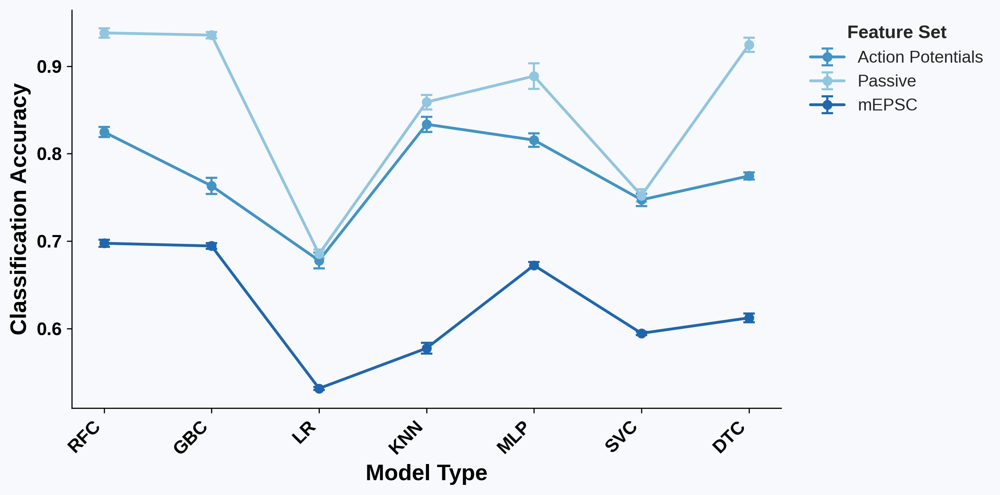

In [ ]:
#POSTER VERSION
plot_colors = {
    "Action Potentials": "#4393c3",
    "Passive": "#92c5de",
    "mEPSC": "#2166ac"
}

model_labels = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

# Narrower width compresses points together; taller height gives more breathing room
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
plt.style.use('seaborn-v0_8-darkgrid')

# Lighter background
ax.set_facecolor('#f7f9fc')
fig.patch.set_facecolor('#f7f9fc')

datasets = {
    "Action Potentials": (spiking_accuracies, spiking_std),
    "Passive":           (passive_accuracies, passive_std),
    "mEPSC":             (mEPSC_accuracies,   mEPSC_std),
}

for label, (means, stds) in datasets.items():
    ax.errorbar(
        model_labels, means, yerr=stds,
        label=label,
        color=plot_colors[label],
        marker='o',
        linewidth=2.0,
        markersize=6,
        capsize=4,
        capthick=1.5,
        elinewidth=1.5,
    )

ax.set_ylabel("Classification Accuracy", fontsize=16, fontweight='bold')
ax.set_xlabel("Model Type", fontsize=16, fontweight='bold')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.xticks(rotation=45, ha='right', fontsize=13, fontweight='bold')
plt.yticks(fontsize=13, fontweight='bold')

legend = ax.legend(
    title="Feature Set",
    fontsize=12,
    title_fontsize=13,
    frameon=False,
    bbox_to_anchor=(1.02, 1.0),
    loc='upper left'
)
# Bold legend title
legend.get_title().set_fontweight('bold')

plt.tight_layout()
plt.show()

In [ ]:
spiking_seed_accuracies

{'RFC': [0.8194308145240432,
  0.8272816486751717,
  0.8331697742885181,
  0.8263002944062807,
  0.8174681059862611],
 'GBC': [0.7546614327772326,
  0.76153091265947,
  0.7782139352306182,
  0.7684003925417076,
  0.7526987242394504],
 'LR': [0.6830225711481845,
  0.6790971540726202,
  0.6604514229636899,
  0.6790971540726202,
  0.6869479882237488],
 'KNN': [0.8498527968596663,
  0.8243375858684985,
  0.8331697742885181,
  0.8292443572129539,
  0.831207065750736],
 'MLP': [0.803729146221786,
  0.8263002944062807,
  0.8125613346418057,
  0.8204121687929342,
  0.8145240431795878],
 'SVC': [0.7585868498527969,
  0.7438665358194309,
  0.746810598626104,
  0.7369970559371933,
  0.7497546614327772],
 'DTC': [0.7782139352306182,
  0.7713444553483808,
  0.7713444553483808,
  0.7801766437684003,
  0.7713444553483808]}

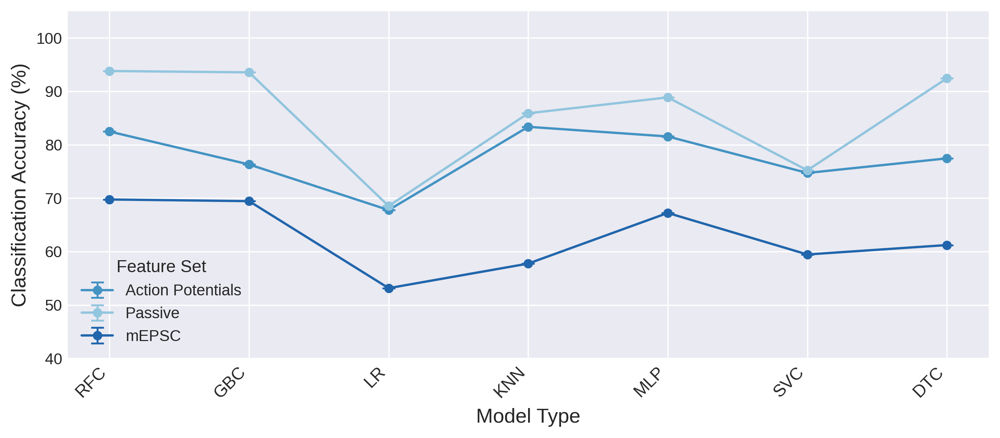

In [116]:
#PAPER VERSION

fig, ax = plt.subplots(figsize=(9, 4), dpi=300)
plt.style.use('seaborn-v0_8-darkgrid')
spiking_accuracies = []
spiking_std = []
for model, accuracies in spiking_seed_accuracies.items():
  mu = np.mean(accuracies)
  sigma = np.std(accuracies)
  spiking_accuracies.append(mu*100)
  spiking_std.append(sigma)

passive_accuracies = []
passive_std = []
for model, accuracies in passive_seed_accuracies.items():
  mu = np.mean(accuracies)
  sigma = np.std(accuracies)
  passive_accuracies.append(mu*100)
  passive_std.append(sigma)

mEPSC_accuracies = []
mEPSC_std = []
for model, accuracies in mEPSC_seed_accuracies.items():
  mu = np.mean(accuracies)
  sigma = np.std(accuracies)
  mEPSC_accuracies.append(mu*100)
  mEPSC_std.append(sigma)

datasets = {
    "Action Potentials": (spiking_accuracies, spiking_std),
    "Passive":           (passive_accuracies, passive_std),
    "mEPSC":             (mEPSC_accuracies,   mEPSC_std),
}
plot_colors = {
    "Action Potentials": "#4393c3",
    "Passive": "#92c5de",
    "mEPSC": "#2166ac"
}

model_labels = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

for label, (means, stds) in datasets.items():
    ax.errorbar(
        model_labels, means, yerr=stds,
        label=label,
        color=plot_colors[label],
        marker='o',
        linewidth=1.5,
        markersize=5,
        capsize=4,
        capthick=1.2,
        elinewidth=1.2,
    )
plt.ylim(40, 105)

# Use RFC (x index = 0) anchored to actual data values
passive_rfc = passive_accuracies[0]
spiking_rfc = spiking_accuracies[0]
mepsc_rfc   = mEPSC_accuracies[0]



ax.set_ylabel("Classification Accuracy (%)", fontsize=13)
ax.set_xlabel("Model Type", fontsize=13)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.xticks(rotation=45, ha='right', fontsize=11)
plt.yticks(fontsize=10)

ax.legend(title="Feature Set", fontsize=10, title_fontsize=11, frameon=False)

plt.tight_layout()
plt.savefig(base_path + 'figure3.svg', bbox_inches='tight')
plt.show()



In [ ]:
print("="*10, "Model Accuracies and Standard Deviations", "="*10)

print("="*15, "mEPSC", "="*15)
for model, accuracies in mEPSC_seed_accuracies.items():
  mu = np.mean(accuracies)
  sigma = np.std(accuracies)
  print(f"{model}: {mu:.4f} ± {sigma:.4f}")

print("="*15, "AP", "="*15)
for model, accuracies in spiking_seed_accuracies.items():
  mu = np.mean(accuracies)
  sigma = np.std(accuracies)
  print(f"{model}: {mu:.4f} ± {sigma:.4f}")

print("="*15, "Passive", "="*15)
for model, accuracies in passive_seed_accuracies.items():
  mu = np.mean(accuracies)
  sigma = np.std(accuracies)
  print(f"{model}: {mu:.4f} ± {sigma:.4f}")



========== Model Accuracies and Standard Deviations ==========
=============== mEPSC ===============
RFC: 0.6975 ± 0.0040
GBC: 0.6944 ± 0.0031
LR: 0.5315 ± 0.0017
KNN: 0.5775 ± 0.0062
MLP: 0.6723 ± 0.0036
SVC: 0.5945 ± 0.0019
DTC: 0.6122 ± 0.0049
=============== AP ===============
RFC: 0.8247 ± 0.0057
GBC: 0.7631 ± 0.0094
LR: 0.6777 ± 0.0091
KNN: 0.8336 ± 0.0087
MLP: 0.8155 ± 0.0076
SVC: 0.7472 ± 0.0071
DTC: 0.7745 ± 0.0039
=============== Passive ===============
RFC: 0.9381 ± 0.0054
GBC: 0.9355 ± 0.0036
LR: 0.6853 ± 0.0050
KNN: 0.8589 ± 0.0083
MLP: 0.8887 ± 0.0147
SVC: 0.7521 ± 0.0071
DTC: 0.9245 ± 0.0082


#### **Classification Report Figure**

In [84]:
passive_diestrus_recalls = []
passive_estrus_recalls = []
passive_Eproestrus_recalls = []
passive_Lproestrus_recalls = []
for model_report in passive_classification_reports.values():
  passive_diestrus_recalls.append(model_report['0']['recall'])
  passive_estrus_recalls.append(model_report['1']['recall'])
  passive_Eproestrus_recalls.append(model_report['2']['recall'])
  passive_Lproestrus_recalls.append(model_report['3']['recall'])

spiking_diestrus_recalls = []
spiking_estrus_recalls = []
spiking_Eproestrus_recalls = []
spiking_Lproestrus_recalls = []
for model_report in spiking_classification_reports.values():
  spiking_diestrus_recalls.append(model_report['0']['recall'])
  spiking_estrus_recalls.append(model_report['1']['recall'])
  spiking_Eproestrus_recalls.append(model_report['2']['recall'])
  spiking_Lproestrus_recalls.append(model_report['3']['recall'])

mEPSC_diestrus_recalls = []
mEPSC_estrus_recalls = []
mEPSC_Eproestrus_recalls = []
mEPSC_Lproestrus_recalls = []
for model_report in mEPSC_classification_reports.values():
  mEPSC_diestrus_recalls.append(model_report['0']['recall'])
  mEPSC_estrus_recalls.append(model_report['1']['recall'])
  mEPSC_Eproestrus_recalls.append(model_report['2']['recall'])
  mEPSC_Lproestrus_recalls.append(model_report['3']['recall'])


#Planning this out, I think I would like to plot things out per dataset so to see the difference in mean recall value across phases within each dataset and also generally across datasets
#4 subplots: (1) spiking recalls separated across phase (2) passive recalls separated across phase (3) mEPSC recalls separated across phase (4) recalls across each dataset labeled by model(?)
#How do I wanna present this? As a bar plot or individual little dots on each where y-axis is recall value and x-axis is phase for the first three and then for the fourth
#Have x-axis be dataset and y-axis be recalln colored by phase? Sometimes I forget that I have a mentor that is an expert with this stuff, maybe I should just ask him what he thinks...

In [ ]:
print("Passive")
print(f"Diestrus: {np.mean(passive_diestrus_recalls):.4f} +- {np.std(passive_diestrus_recalls):.4f}")
print(f"Estrus: {np.mean(passive_estrus_recalls):.4f} +- {np.std(passive_estrus_recalls):.4f}")
print(f"Early Proestrus: {np.mean(passive_Eproestrus_recalls):.4f} +- {np.std(passive_Eproestrus_recalls):.4f}")
print(f"Late Proestrus: {np.mean(passive_Lproestrus_recalls):.4f} +- {np.std(passive_Lproestrus_recalls):.4f}")

print("AP")
print(f"Diestrus: {np.mean(spiking_diestrus_recalls):.4f} +- {np.std(spiking_diestrus_recalls):.4f}")
print(f"Estrus: {np.mean(spiking_estrus_recalls):.4f} +- {np.std(spiking_estrus_recalls):.4f}")
print(f"Early Proestrus: {np.mean(spiking_Eproestrus_recalls):.4f} +- {np.std(spiking_Eproestrus_recalls):.4f}")
print(f"Late Proestrus: {np.mean(spiking_Lproestrus_recalls):.4f} +- {np.std(spiking_Lproestrus_recalls):.4f}")

print("mEPSC")
print(f"Diestrus: {np.mean(mEPSC_diestrus_recalls):.4f} +- {np.std(mEPSC_diestrus_recalls):.4f}")
print(f"Estrus: {np.mean(mEPSC_estrus_recalls):.4f} +- {np.std(mEPSC_estrus_recalls):.4f}")
print(f"Early Proestrus: {np.mean(mEPSC_Eproestrus_recalls):.4f} +- {np.std(mEPSC_Eproestrus_recalls):.4f}")
print(f"Late Proestrus: {np.mean(mEPSC_Lproestrus_recalls):.4f} +- {np.std(mEPSC_Lproestrus_recalls):.4f}")

Passive
Diestrus: 0.8957 +- 0.0317
Estrus: 0.6043 +- 0.3266
Early Proestrus: 0.7557 +- 0.1552
Late Proestrus: 0.9992 +- 0.0009
AP
Diestrus: 0.7684 +- 0.0371
Estrus: 0.4361 +- 0.1807
Early Proestrus: 0.5705 +- 0.1391
Late Proestrus: 0.9384 +- 0.0144
mEPSC
Diestrus: 0.5980 +- 0.0819
Estrus: 0.4961 +- 0.1018
Early Proestrus: 0.5995 +- 0.0977
Late Proestrus: 0.8628 +- 0.0399


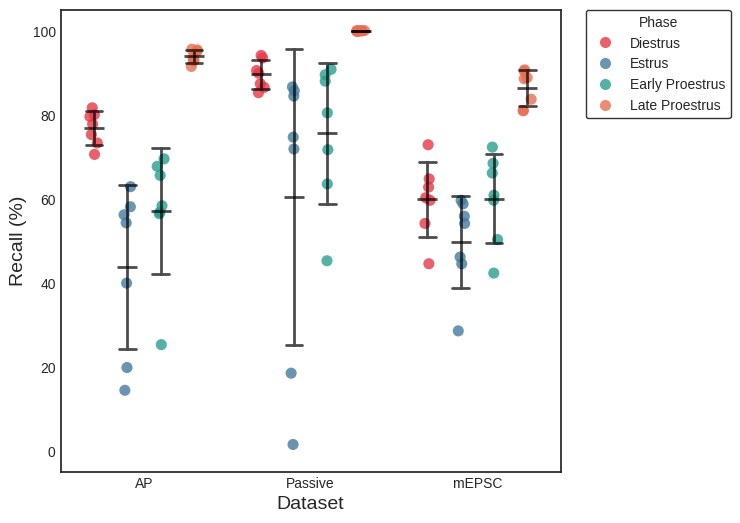

In [117]:
plt.style.use('seaborn-v0_8-white')

phase_labels = ['Diestrus', 'Estrus', 'Early Proestrus', 'Late Proestrus']


def make_long_df(diestrus, estrus, eproestrus, lproestrus, dataset_name):
    model_names = list(passive_classification_reports.keys())  # same models/order across all three
    rows = []
    for recalls, phase in zip([diestrus, estrus, eproestrus, lproestrus], phase_labels):
        for model, val in zip(model_names, recalls):
            rows.append({'phase': phase, 'Recall': val*100, 'model': model, 'Dataset': dataset_name})
    return pd.DataFrame(rows)

passive_df = make_long_df(passive_diestrus_recalls, passive_estrus_recalls,
                           passive_Eproestrus_recalls, passive_Lproestrus_recalls, 'Passive')
spiking_df = make_long_df(spiking_diestrus_recalls, spiking_estrus_recalls,
                           spiking_Eproestrus_recalls, spiking_Lproestrus_recalls, 'AP')
mEPSC_df = make_long_df(mEPSC_diestrus_recalls, mEPSC_estrus_recalls,
                         mEPSC_Eproestrus_recalls, mEPSC_Lproestrus_recalls, 'mEPSC')

combined_df = pd.concat([spiking_df, passive_df, mEPSC_df], ignore_index=True)


class_colors = ['#E63946', '#457B9D', '#2A9D8F', '#E76F51']


fig, ax = plt.subplots(figsize=(8, 6))
fig.patch.set_facecolor('white')
ax.set_facecolor('white')

sns.stripplot(data=combined_df, x='Dataset', y='Recall', hue='phase',
              hue_order=phase_labels, dodge=True, size=8, jitter=0.1,
              alpha=0.8, palette=class_colors, ax=ax)

sns.pointplot(data=combined_df, x='Dataset', y='Recall', hue='phase',
              hue_order=phase_labels, dodge=0.8 - 0.8/len(phase_labels),
              estimator='mean', errorbar='sd', alpha=0.7,
              markers='_', markersize=15, markeredgewidth=2,
              linestyle='none', capsize=0.10,
              err_kws={'linewidth': 2, 'color': 'black', 'alpha': 0.7},
              palette=['#000000', '#000000', '#000000', '#000000'], legend=False,
              zorder=10, ax=ax)

ax.set_ylim(-5, 105)
ax.set_ylabel("Recall (%)", fontsize=14)
ax.set_xlabel("Dataset", fontsize=14)

legend = ax.legend(title='Phase', bbox_to_anchor=(1.05, 1), loc='upper left',
                    frameon=True, edgecolor='black', facecolor='white',
                    borderaxespad=0.)

# reserve room on the right for the legend instead of tight_layout
fig.subplots_adjust(right=0.75)
plt.savefig(base_path + 'figure6.svg', bbox_inches='tight')
plt.show()

#### **Feature Importances Figure**

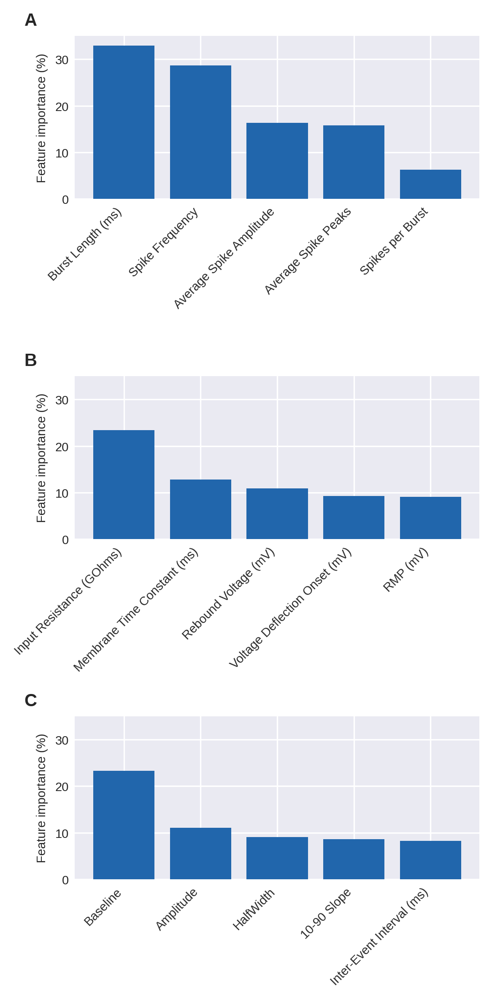

In [133]:
# Set the plot style and color
plt.style.use('seaborn-v0_8-darkgrid')
plot_color = "#2166ac"

# Create figure with 3 subplots
fig, axes = plt.subplots(3, 1, figsize=(4, 8), dpi=300)

# ============== Panel A: Spiking Dataset ==============


# Top 5 features
axes[0].bar(
    range(5),
    spiking_importances["mean"]*100,
    color=plot_color,
    linewidth=0
)

axes[0].set_ylabel("Feature importance (%)", fontsize=7)
axes[0].set_title("A", fontsize=10, fontweight='bold', loc='left', x=-0.125, y=1)
axes[0].set_xticks(range(5))
axes[0].set_xticklabels(spiking_top5, rotation=45, ha='right', fontsize=7)
axes[0].tick_params(axis='y', labelsize=7)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ============== Panel B: Passive Dataset ==============
# Top 5 features
axes[1].bar(
    range(5),
    passive_importances["mean"]*100,
    color=plot_color,
    linewidth=0
)

axes[1].set_ylabel("Feature importance (%)", fontsize=7)
axes[1].set_title("B", fontsize=10, fontweight='bold', loc='left',  x=-0.125, y=1)
axes[1].set_xticks(range(5))
axes[1].set_xticklabels(passive_top5, rotation=45, ha='right', fontsize=7)
axes[1].tick_params(axis='y', labelsize=7)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

# ============== Panel C: mEPSC Dataset ==============
# Top 5 features
axes[2].bar(
    range(5),
    mEPSC_importances["mean"]*100,
    color=plot_color,
    linewidth=0
)

axes[2].set_ylabel("Feature importance (%)", fontsize=7)
axes[2].set_title("C", fontsize=10, fontweight='bold', loc='left',  x=-0.125, y=1)
axes[2].set_xticks(range(5))
axes[2].set_xticklabels(mEPSC_top5, rotation=45, ha='right', fontsize=7)
axes[2].tick_params(axis='y', labelsize=7)
axes[2].spines['top'].set_visible(False)
axes[2].spines['right'].set_visible(False)


# Set the same y-axis limits for all three panels
for ax in axes:
    ax.set_ylim(0, 35)  # Add 5% padding at the top

plt.tight_layout()
plt.savefig(base_path + 'figure4.svg', bbox_inches='tight')
plt.show()


#### **Data Types Figure**

In [135]:
fig2_X_mEPSC_diestrus = read_abf(raw_mEPSC_diestrus[0])
fig2_X_mEPSC_estrus = read_abf(raw_mEPSC_estrus[0])
fig2_X_mEPSC_Eproestrus = read_abf(raw_mEPSC_Eproestrus[0])
fig2_X_mEPSC_Lproestrus = read_abf(raw_mEPSC_Lproestrus[0])

fig2_X_spike_diestrus = read_abf(raw_spike_diestrus[0])
fig2_X_spike_estrus = read_abf(raw_spike_estrus[0])
fig2_X_spike_Eproestrus = read_abf(raw_spike_Eproestrus[0])
fig2_X_spike_Lproestrus = read_abf(raw_spike_Lproestrus[0])

fig2_X_passive_diestrus = read_abf(raw_passive_diestrus[0])
fig2_X_passive_estrus = read_abf(raw_passive_estrus[0])
fig2_X_passive_Eproestrus = read_abf(raw_passive_Eproestrus[0])
fig2_X_passive_Lproestrus = read_abf(raw_passive_Lproestrus[0])

In [136]:
abf3 = pyabf.ABF(raw_spike_diestrus[0])
abf3.dataPointsPerMs*1000

20000

In [137]:
abf = pyabf.ABF(raw_mEPSC_diestrus[0])
abf.dataPointsPerMs*1000

20000

In [138]:
def filter_signal(current, freq=20000):

  raw_signal = current
  adjusted_signal = raw_signal - np.median(raw_signal)

  b_lowpass, a_lowpass = signal.bessel(4, 1000, 'low', analog=False, norm='phase', fs=freq)
  b_notch, a_notch = signal.iirnotch(60.0, 30.0, fs=freq)

  b_multiband = signal.convolve(b_lowpass, b_notch)
  a_multiband = signal.convolve(a_lowpass, a_notch)

  filtered_signal = signal.filtfilt(b_multiband, a_multiband, adjusted_signal)

  return filtered_signal

In [139]:
filtered = filter_signal(fig2_X_mEPSC_diestrus)

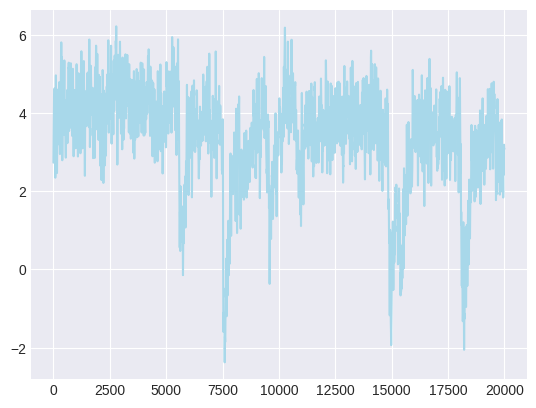

In [140]:
plt.plot(filtered[130000:150000], color="#A8D8EA")

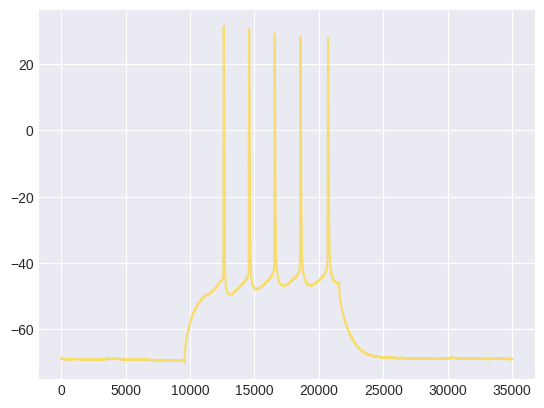

In [141]:
plt.plot(fig2_X_spike_diestrus[800000:835000], color="#F7DC6F")


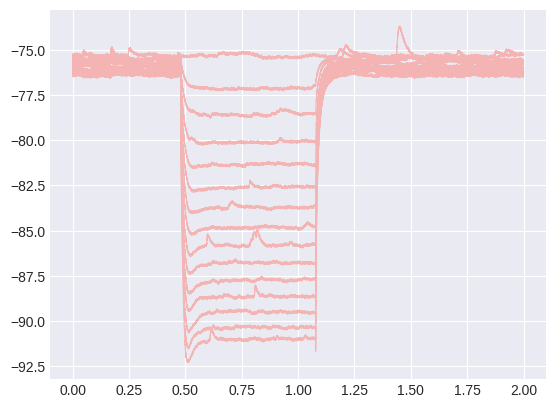

In [142]:
abf2 = pyabf.ABF(raw_passive_diestrus[0])

for sweep in abf2.sweepList:
  abf2.setSweep(sweep)
  plt.plot(abf2.sweepX[:40000], abf2.sweepY[:40000], color="#F4B4B4", linewidth=0.75)


In [143]:
len(abf2.sweepX)

100000

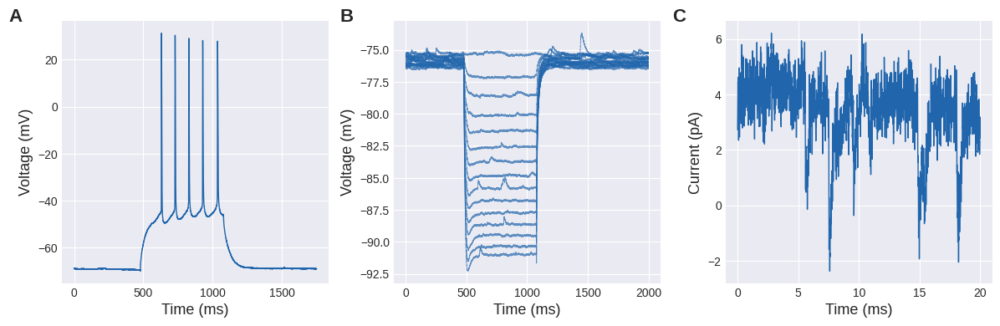

In [144]:
# Data figure - 3 side by side plots
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))

# Use a clean, professional style
plt.style.use('seaborn-v0_8-darkgrid')

# Define professional color
plot_color = "#2166ac"  # Professional blue

# Panel A: Spiking plot
spike_data = fig2_X_spike_diestrus[800000:835000]
time_spike = np.arange(len(spike_data)) / abf3.dataPointsPerMs #Mud had me dividing by 1000 before...
ax[0].plot(time_spike, spike_data, color=plot_color, linewidth=1.0)
ax[0].set_ylabel("Voltage (mV)", fontsize=13)
ax[0].set_xlabel("Time (ms)", fontsize=13)
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)


# Panel B: Sweep data
for sweep in abf2.sweepList:
    abf2.setSweep(sweep)
    time_sweep = abf2.sweepX[:40000] * 1000
    ax[1].plot(time_sweep, abf2.sweepY[:40000], color=plot_color,
               linewidth=0.5, alpha=0.7)
ax[1].set_ylabel("Voltage (mV)", fontsize=13)
ax[1].set_xlabel("Time (ms)", fontsize=13)
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)

# Panel C: Filtered current
current_data = filtered[130000:150000]
time_current = np.arange(len(current_data)) / 1000
ax[2].plot(time_current, current_data, color=plot_color, linewidth=1.0)
ax[2].set_ylabel("Current (pA)", fontsize=13)  # Changed from mA to pA (more typical)
ax[2].set_xlabel("Time (ms)", fontsize=13)
ax[2].spines['top'].set_visible(False)
ax[2].spines['right'].set_visible(False)

# Add panel labels
for i, label in enumerate(['A', 'B', 'C']):
    ax[i].text(-0.15, 1.05, label, transform=ax[i].transAxes,
              fontsize=16, fontweight='bold', va='top', ha='right')

# Add scale bars instead of or in addition to axes (optional, comment out if not needed)
# Example for panel A:
# from matplotlib.patches import Rectangle
# scalebar_x = 5  # 5 seconds
# scalebar_y = 20  # 20 mV
# ax[0].plot([max(time_spike)-scalebar_x-1, max(time_spike)-1],
#            [min(spike_data)+5, min(spike_data)+5], 'k', linewidth=2)
# ax[0].plot([max(time_spike)-1, max(time_spike)-1],
#            [min(spike_data)+5, min(spike_data)+5+scalebar_y], 'k', linewidth=2)

plt.tight_layout()
plt.savefig(base_path + 'figure1.svg', bbox_inches='tight')
plt.show()

#### **t-SNE Figure**

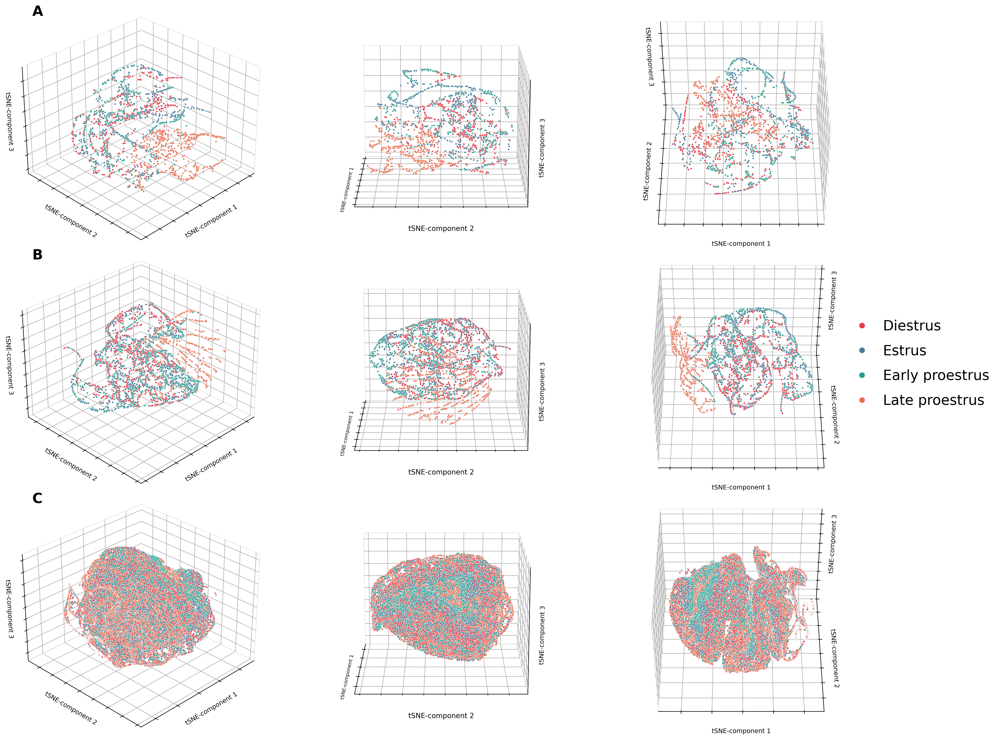

In [145]:
plt.style.use('default')

views = [(30, 45), (15, 180), (45, 270)]
zoom = 1.2

data_sets = [
    (spiking_tSNE_comp1_3d, spiking_tSNE_comp2_3d, spiking_tSNE_comp3_3d, tSNE_y_spiking),
    (passive_tSNE_comp1_3d, passive_tSNE_comp2_3d, passive_tSNE_comp3_3d, tSNE_y_passive),
    (mEPSC_tSNE_comp1_3d,   mEPSC_tSNE_comp2_3d,   mEPSC_tSNE_comp3_3d, tSNE_y_mEPSC)
]
row_titles = ['A', 'B', 'C']

# labelpad tuned per view to compensate for mplot3d's projection distortion
# (a near face-on view compresses the projected axis, making fixed-size
# label text appear larger/closer than the same text on an oblique view)
label_style = {
    (30, 45):  {'x': {'pad': -6, 'size': 9}, 'y': {'pad': -6, 'size': 9}, 'z': {'pad': -10, 'size': 9}},
    (15, 180): {'x': {'pad': -8, 'size': 7}, 'y': {'pad': -2, 'size': 10}, 'z': {'pad': -10, 'size': 9}},
    (45, 270): {'x': {'pad': -6, 'size': 9}, 'y': {'pad': -6, 'size': 9}, 'z': {'pad': -6, 'size': 9}},
}

fig = plt.figure(figsize=(22, 18), dpi=300)
fig.patch.set_facecolor('white')
plt.subplots_adjust(wspace=0.15, hspace=0.15)

scatter = None
class_colors = ['#E63946', '#457B9D', '#2A9D8F', '#E76F51']
cmap = mcolors.ListedColormap(class_colors)

for row, (comp1, comp2, comp3, labels) in enumerate(data_sets):
    for col, (elev, azim) in enumerate(views):
        ax = fig.add_subplot(3, 3, row * 3 + col + 1, projection='3d')
        ax.set_facecolor('white')
        ax.set_box_aspect(None, zoom=zoom)

        scatter = ax.scatter(
            comp1, comp2, comp3,
            c=labels,
            cmap=cmap,
            alpha=1,
            s=6,
            vmin=0, vmax=3,
            edgecolor='w',
            linewidth=0.25
        )

        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_zticklabels([])
        ax.tick_params(axis='both', which='both', length=0)
        ax.view_init(elev=elev, azim=azim)

        ls = label_style[(elev, azim)]
        ax.set_xlabel('tSNE-component 1', fontsize=ls['x']['size'], labelpad=ls['x']['pad'])
        ax.set_ylabel('tSNE-component 2', fontsize=ls['y']['size'], labelpad=ls['y']['pad'])
        ax.set_zlabel('tSNE-component 3', fontsize=ls['z']['size'], labelpad=ls['z']['pad'])

        ax.xaxis.pane.fill = False
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False
        ax.xaxis.pane.set_edgecolor('lightgrey')
        ax.yaxis.pane.set_edgecolor('lightgrey')
        ax.zaxis.pane.set_edgecolor('lightgrey')
        ax.grid(True, color='lightgrey', linewidth=0.5)

        if col == 0:
            ax.set_title(row_titles[row], fontsize=20, fontweight='bold', loc='left', pad=2)

legend_labels = ['Diestrus', 'Estrus', 'Early proestrus', 'Late proestrus']
legend_handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=c,
               markersize=9, label=l)
    for c, l in zip(class_colors, legend_labels)
]
fig.legend(
    handles=legend_handles,
    labels=legend_labels,
    fontsize=20,
    title_fontsize=0,
    frameon=False,
    loc='center right',
    bbox_to_anchor=(1.02, 0.5),
    handletextpad=0.5,
    labelspacing=0.8,
)

plt.savefig(base_path + 'figure5.svg', bbox_inches='tight')
plt.show()

### **Stats**


#### **AP vs. passive vs. mEPSC accuracies**

In [ ]:
model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']
all_accuracies_data = []

# Populate with mEPSC seed accuracies (individual values from each seed)
for name in model_names:
    for acc in mEPSC_seed_accuracies[name]:
        all_accuracies_data.append({
            "Accuracy": acc,
            "Feature_Set": "mEPSC",
            "Model": name
        })

# Populate with spiking seed accuracies
for name in model_names:
    for acc in spiking_seed_accuracies[name]:
        all_accuracies_data.append({
            "Accuracy": acc,
            "Feature_Set": "AP",
            "Model": name
        })

# Populate with passive seed accuracies
for name in model_names:
    for acc in passive_seed_accuracies[name]:
        all_accuracies_data.append({
            "Accuracy": acc,
            "Feature_Set": "Passive",
            "Model": name
        })

accuracies_df = pd.DataFrame(all_accuracies_data)

# Drop rows with NaN or inf values in the 'Accuracy' column just in case
accuracies_df = accuracies_df.replace([np.inf, -np.inf], np.nan).dropna(subset=['Accuracy'])

formula = "Accuracy ~ C(Feature_Set) * C(Model)"

model = smf.ols(formula, data=accuracies_df).fit()

table = sm.stats.anova_lm(model, typ=2)

display(table)

,sum_sq,df,F,PR(>F)
C(Feature_Set),0.948892,2.0,8146.076465,6.650141e-97
C(Model),0.392074,6.0,1121.962042,5.990581e-78
C(Feature_Set):C(Model),0.113218,12.0,161.992678,1.046640e-52
Residual,0.004892,84.0,NaN,NaN


In [ ]:
# Most important: condition effect broken down by feature set
df_grouped = accuracies_df.copy()
df_grouped['group'] = df_grouped['Feature_Set'] + '_' + df_grouped['Model']

tukey = pairwise_tukeyhsd(df_grouped['Accuracy'], df_grouped['group'])
print(tukey.summary())

     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
   group1      group2   meandiff p-adj   lower   upper  reject
--------------------------------------------------------------
     AP_DTC      AP_GBC  -0.0114 0.7111 -0.0292  0.0064  False
     AP_DTC      AP_KNN   0.0591    0.0  0.0413  0.0769   True
     AP_DTC       AP_LR  -0.0968    0.0 -0.1146  -0.079   True
     AP_DTC      AP_MLP    0.041    0.0  0.0232  0.0588   True
     AP_DTC      AP_RFC   0.0502    0.0  0.0325   0.068   True
     AP_DTC      AP_SVC  -0.0273    0.0 -0.0451 -0.0095   True
     AP_DTC Passive_DTC     0.15    0.0  0.1322  0.1678   True
     AP_DTC Passive_GBC    0.161    0.0  0.1432  0.1788   True
     AP_DTC Passive_KNN   0.0845    0.0  0.0667  0.1022   True
     AP_DTC  Passive_LR  -0.0892    0.0  -0.107 -0.0714   True
     AP_DTC Passive_MLP   0.1142    0.0  0.0964   0.132   True
     AP_DTC Passive_RFC   0.1636    0.0  0.1458  0.1814   True
     AP_DTC Passive_SVC  -0.0224 0.0022 -0.0401 -0.0046

#### **Across full vs. subsetted dataset**


In [ ]:
model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']
SEEDS = [42, 7, 13, 21, 99]

# Prepare data for ANOVA
all_accuracies_data = []

# Full dataset accuracies
for model_name in model_names:
    for seed_acc in mEPSC_seed_accuracies[model_name]:
        all_accuracies_data.append({
            'Accuracy': seed_acc,
            'Dataset_Type': 'Full',
            'Feature_Set': 'mEPSC',
            'Model': model_name
        })
    for seed_acc in spiking_seed_accuracies[model_name]:
        all_accuracies_data.append({
            'Accuracy': seed_acc,
            'Dataset_Type': 'Full',
            'Feature_Set': 'Spiking',
            'Model': model_name
        })
    for seed_acc in passive_seed_accuracies[model_name]:
        all_accuracies_data.append({
            'Accuracy': seed_acc,
            'Dataset_Type': 'Full',
            'Feature_Set': 'Passive',
            'Model': model_name
        })

# Even label count dataset accuracies
for model_name in model_names:
    for seed_acc in mEPSC_even_seed_accuracies[model_name]:
        all_accuracies_data.append({
            'Accuracy': seed_acc,
            'Dataset_Type': 'Even_Label',
            'Feature_Set': 'mEPSC',
            'Model': model_name
        })
    for seed_acc in spiking_even_seed_accuracies[model_name]:
        all_accuracies_data.append({
            'Accuracy': seed_acc,
            'Dataset_Type': 'Even_Label',
            'Feature_Set': 'Spiking',
            'Model': model_name
        })
    for seed_acc in passive_even_seed_accuracies[model_name]:
        all_accuracies_data.append({
            'Accuracy': seed_acc,
            'Dataset_Type': 'Even_Label',
            'Feature_Set': 'Passive',
            'Model': model_name
        })


# Create DataFrame
accuracies_df = pd.DataFrame(all_accuracies_data)

# Display the head of the DataFrame to verify
print("DataFrame head for ANOVA:")
display(accuracies_df.head())

# Perform multi-way ANOVA
# Formula: Accuracy is dependent on Dataset_Type, Feature_Set, Model, and their interactions
# The '*' indicates interaction terms as well.
formula = 'Accuracy ~ C(Dataset_Type) * C(Feature_Set) * C(Model)'

model = smf.ols(formula, data=accuracies_df).fit()
anova_table = sm.stats.anova_lm(model, typ=2) # Type 2 ANOVA for unbalanced designs

print("\nANOVA Results:")
display(anova_table)

DataFrame head for ANOVA:


,Accuracy,Dataset_Type,Feature_Set,Model
0,0.704618,Full,mEPSC,RFC
1,0.693809,Full,mEPSC,RFC
2,0.697019,Full,mEPSC,RFC
3,0.698526,Full,mEPSC,RFC
4,0.693547,Full,mEPSC,RFC



ANOVA Results:


,sum_sq,df,F,PR(>F)
C(Dataset_Type),0.003975,1.0,39.790179,2.414618e-09
C(Feature_Set),1.486087,2.0,7437.010067,1.077114e-164
C(Model),1.102534,6.0,1839.183442,2.145294e-150
C(Dataset_Type):C(Feature_Set),0.070797,2.0,354.297250,5.381277e-61
C(Dataset_Type):C(Model),0.033384,6.0,55.689342,1.867283e-37
C(Feature_Set):C(Model),0.275472,12.0,229.763488,1.822368e-97
C(Dataset_Type):C(Feature_Set):C(Model),0.013533,12.0,11.287746,2.134399e-16
Residual,0.016785,168.0,NaN,NaN


In [ ]:
# Most important: condition effect broken down by feature set
df_grouped = accuracies_df.copy()
df_grouped['group'] = df_grouped['Dataset_Type'] + '_' + df_grouped['Feature_Set']

tukey = pairwise_tukeyhsd(df_grouped['Accuracy'], df_grouped['group'])
print(tukey.summary())

            Multiple Comparison of Means - Tukey HSD, FWER=0.05             
      group1             group2       meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------
Even_Label_Passive Even_Label_Spiking  -0.1221    0.0 -0.1799 -0.0642   True
Even_Label_Passive   Even_Label_mEPSC   -0.183    0.0 -0.2408 -0.1252   True
Even_Label_Passive       Full_Passive   0.0094 0.9972 -0.0484  0.0672  False
Even_Label_Passive       Full_Spiking  -0.0687 0.0097 -0.1265 -0.0109   True
Even_Label_Passive         Full_mEPSC  -0.2196    0.0 -0.2775 -0.1618   True
Even_Label_Spiking   Even_Label_mEPSC   -0.061 0.0321 -0.1188 -0.0032   True
Even_Label_Spiking       Full_Passive   0.1314    0.0  0.0736  0.1893   True
Even_Label_Spiking       Full_Spiking   0.0533 0.0894 -0.0045  0.1111  False
Even_Label_Spiking         Full_mEPSC  -0.0976    0.0 -0.1554 -0.0398   True
  Even_Label_mEPSC       Full_Passive   0.1924    0.0  0.1346  0.2502   True

#### **Across randomized vs. non-randomized**


In [ ]:
model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']
SEEDS = [42, 7, 13, 21, 99]

# Prepare data for ANOVA
all_accuracies_rnd_data = []

# Full dataset accuracies — real labels
for model_name in model_names:
    for seed_acc in mEPSC_seed_accuracies[model_name]:
        all_accuracies_rnd_data.append({
            'Accuracy': seed_acc,
            'Label_Type': 'Real',
            'Feature_Set': 'mEPSC',
            'Model': model_name
        })
    for seed_acc in spiking_seed_accuracies[model_name]:
        all_accuracies_rnd_data.append({
            'Accuracy': seed_acc,
            'Label_Type': 'Real',
            'Feature_Set': 'Spiking',
            'Model': model_name
        })
    for seed_acc in passive_seed_accuracies[model_name]:
        all_accuracies_rnd_data.append({
            'Accuracy': seed_acc,
            'Label_Type': 'Real',
            'Feature_Set': 'Passive',
            'Model': model_name
        })

# Randomized label control accuracies
for model_name in model_names:
    for seed_acc in mEPSC_rnd_seed_accuracies[model_name]:
        all_accuracies_rnd_data.append({
            'Accuracy': seed_acc,
            'Label_Type': 'Randomized',
            'Feature_Set': 'mEPSC',
            'Model': model_name
        })
    for seed_acc in spiking_rnd_seed_accuracies[model_name]:
        all_accuracies_rnd_data.append({
            'Accuracy': seed_acc,
            'Label_Type': 'Randomized',
            'Feature_Set': 'Spiking',
            'Model': model_name
        })
    for seed_acc in passive_rnd_seed_accuracies[model_name]:
        all_accuracies_rnd_data.append({
            'Accuracy': seed_acc,
            'Label_Type': 'Randomized',
            'Feature_Set': 'Passive',
            'Model': model_name
        })

# Create DataFrame
accuracies_rnd_df = pd.DataFrame(all_accuracies_rnd_data)


# Multi-way ANOVA: effect of Label_Type (Real vs Randomized), Feature_Set, Model, and interactions
formula = 'Accuracy ~ C(Label_Type) * C(Feature_Set) * C(Model)'

rnd_anova_model = smf.ols(formula, data=accuracies_rnd_df).fit()
anova_rnd_table = sm.stats.anova_lm(rnd_anova_model, typ=2)  # Type 2 for unbalanced designs

display(anova_rnd_table)

,sum_sq,df,F,PR(>F)
C(Label_Type),9.544423,1.0,21528.490810,2.881172e-179
C(Feature_Set),0.803411,2.0,906.090375,1.006407e-90
C(Model),0.181837,6.0,68.358813,1.525009e-42
C(Label_Type):C(Feature_Set),0.562475,2.0,634.361957,5.088863e-79
C(Label_Type):C(Model),0.288727,6.0,108.542650,3.672169e-55
C(Feature_Set):C(Model),0.096042,12.0,18.052729,1.491714e-24
C(Label_Type):C(Feature_Set):C(Model),0.078861,12.0,14.823386,7.158673e-21
Residual,0.074481,168.0,NaN,NaN


#### **Across Phase and Dataset in Classification Reports**


In [ ]:
all_accuracies_data = []

for name in model_names:
  rep = mEPSC_classification_reports[name]
  iter = 0
  for key, value in rep.items():
    if iter > 3:
      break
    all_accuracies_data.append({
        "Recall": value['recall'], #recall
        "Model": name,
        "Phase": key,
        "Feature_Set": "mEPSC"
    })
    iter += 1

for name in model_names:
  rep = spiking_classification_reports[name]
  iter = 0
  for key, value in rep.items():
    if iter > 3:
      break
    all_accuracies_data.append({
        "Recall": value['recall'], #recall
        "Model": name,
        "Phase": key,
        "Feature_Set": "AP"
    })
    iter += 1

for name in model_names:
  rep = passive_classification_reports[name]
  iter = 0
  for key, value in rep.items():
    if iter > 3:
      break
    all_accuracies_data.append({
        "Recall": value['recall'], #recall
        "Model": name,
        "Phase": key,
        "Feature_Set": "Passive"
    })
    iter += 1

accuracies_df = pd.DataFrame(all_accuracies_data)

# Drop any potential NaN or inf values in 'Recall' column before ANOVA
accuracies_df = accuracies_df.replace([np.inf, -np.inf], np.nan).dropna(subset=['Recall'])

# Modified formula to avoid a saturated model (removing the three-way interaction)
formula = "Recall ~ C(Phase) * C(Feature_Set) + C(Phase) * C(Model) + C(Feature_Set) * C(Model)"

model = smf.ols(formula, data=accuracies_df).fit()

table = sm.stats.anova_lm(model, typ=2)

display(table)


,sum_sq,df,F,PR(>F)
C(Phase),2.008983,3.0,90.348972,8.075416e-17
C(Feature_Set),0.469982,2.0,31.704358,1.147637e-08
C(Model),0.544055,6.0,12.233745,1.842728e-07
C(Phase):C(Feature_Set),0.148273,6.0,3.334092,1.026852e-02
C(Phase):C(Model),0.511840,18.0,3.836452,2.926833e-04
C(Feature_Set):C(Model),0.172242,12.0,1.936542,6.257390e-02
Residual,0.266830,36.0,NaN,NaN


In [ ]:
df_grouped = accuracies_df.copy()
df_grouped['group'] = df_grouped['Phase'] + '_' + df_grouped['Feature_Set']

tukey = pairwise_tukeyhsd(df_grouped['Recall'], df_grouped['group'])
print(tukey.summary())

   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
  group1    group2  meandiff p-adj   lower   upper  reject
----------------------------------------------------------
     0_AP 0_Passive   0.1273 0.8829 -0.1329  0.3875  False
     0_AP   0_mEPSC  -0.1704 0.5468 -0.4305  0.0898  False
     0_AP      1_AP  -0.3323 0.0027 -0.5924 -0.0721   True
     0_AP 1_Passive  -0.1641 0.6033 -0.4243  0.0961  False
     0_AP   1_mEPSC  -0.2723 0.0322 -0.5325 -0.0121   True
     0_AP      2_AP  -0.1978 0.3167  -0.458  0.0623  False
     0_AP 2_Passive  -0.0127    1.0 -0.2729  0.2475  False
     0_AP   2_mEPSC  -0.1689   0.56 -0.4291  0.0913  False
     0_AP      3_AP   0.1701 0.5495 -0.0901  0.4302  False
     0_AP 3_Passive   0.2309 0.1308 -0.0293   0.491  False
     0_AP   3_mEPSC   0.0944  0.985 -0.1657  0.3546  False
0_Passive   0_mEPSC  -0.2977  0.012 -0.5578 -0.0375   True
0_Passive      1_AP  -0.4596    0.0 -0.7197 -0.1994   True
0_Passive 1_Passive  -0.2914 0.0154 -0.5516 -0.0312   Tr